In [4]:
import os
import numpy as np
from scipy.optimize import minimize, fmin_l_bfgs_b
from skimage.measure import block_reduce

import numpy.ma as ma
import matplotlib.pyplot as plt
import cmocean 
import xarray as xr
from tqdm import trange
import matplotlib as mpl
plt.style.use('../SIC/presentation.mplstyle')

time = np.load('time_test.npy', allow_pickle = True)[::2]
#time = time.indexes['time']
#time_test = time[2].indexes['time']

#Time info for seasonal forecast
#time1 = time_val[::2]
#time2 = time_test[::2]
#time = np.concatenate((time1, time2), axis=None)
#print(np.shape(time1))
print(np.shape(time))
mask = np.load('../flavia/mask_LR.npy')
mask = 1 - mask
from numpy.linalg import svd

mask_flatten = mask.flatten()
        #Get non-masked position
unflatten = np.where((mask.flatten()>0))
N_z_reduced = np.shape(unflatten[0])[0]
mask_flatten = mask.flatten()
N_mask = (128*128)/N_z_reduced
mean_input =0.38415005912623124
std_input = 0.7710474897556033
C = N_mask*std_input
def rmse(x, y):
    return np.sqrt(np.mean((x - y)**2, axis = (1, 2)))

def reverse_normalize_input(x):
        return  x * std_input + mean_input

(1460,)


# Fig 01 - neXtSIM + Observations

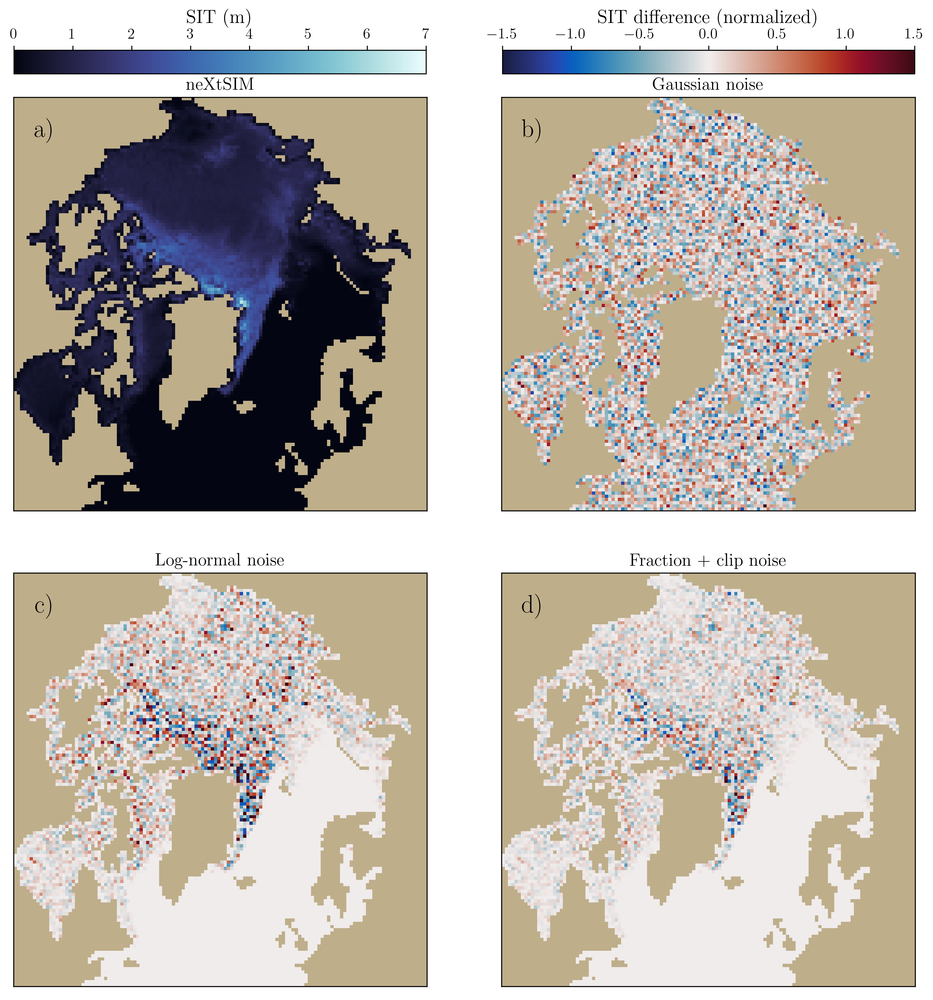

In [13]:
obs_frac = np.load('1July/test_inf1_frac/obs.npy')
obs_clip = np.load('14Avril/test_inf1_frac_clip/obs.npy')
obs_gauss = np.load('14Avril/test_EOF_inf1_gauss/obs.npy')

truth= np.load('2Avril/test_inf06_EOF_adapt/x_truth.npy')


plt.rcParams['axes.facecolor'] = 'xkcd:putty'

fig = plt.figure(figsize = (13, 13))
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.15, hspace=0.15)

ax1 = plt.subplot2grid((2, 2), (0, 0))
ax2 = plt.subplot2grid((2, 2), (0, 1))
ax3 = plt.subplot2grid((2, 2), (1, 0))
ax4 = plt.subplot2grid((2, 2), (1, 1))                                    

ax1.set_title('neXtSIM', fontsize = 14)
im1 = ax1.imshow(ma.masked_array(reverse_normalize_input(truth[32*0]).reshape((128,128)), mask = 1 - mask), origin = 'lower', cmap = cmocean.cm.ice, vmin = 0, vmax = 7)

ax1.grid(False)
ax1.set_xticks([])
ax1.set_yticks([])

ax2.set_title('Gaussian noise', fontsize = 14)
im2 = ax2.imshow(ma.masked_array(obs_gauss[0*32] - truth[32*0], mask = 1 - mask), origin = 'lower', cmap = cmocean.cm.balance, vmin = -1.5, vmax = 1.5)
ax2.set_xticks([])
ax2.set_yticks([])

ax2.grid(False)

ax3.set_title('Log-normal noise', fontsize = 14)
im3 = ax3.imshow(ma.masked_array(obs_frac[0]- truth[0].reshape((128,128)), mask = 1 - mask), origin = 'lower', cmap = cmocean.cm.balance, vmin = -1.5, vmax = 1.5)
ax3.set_xticks([])
ax3.set_yticks([])

ax3.grid(False)

ax4.set_title('Fraction + clip noise', fontsize = 14)
im4 = ax4.imshow(ma.masked_array(obs_clip[0]- truth[0].reshape((128,128)), mask = 1 - mask), origin = 'lower', cmap = cmocean.cm.balance, vmin = -1.5, vmax = 1.5)
ax4.grid(False)

ax4.set_xticks([])
ax4.set_yticks([])






cbar_ax = fig.add_axes([0.13, 0.9, 0.35, 0.02])  # [left, bottom, width, height]
cbar_ax2 = fig.add_axes([0.545, 0.9, 0.35, 0.02])

# Add the colorbar
cb1 = fig.colorbar(im1, cax=cbar_ax, orientation='horizontal', aspect=18.5, pad=0)
cb1.ax.tick_params(labelsize=12)

cb1.set_label("SIT (m)", fontsize = 15)

cb2 = fig.colorbar(im4, ax=[ax2], cax = cbar_ax2, orientation='horizontal', aspect=18.5, pad=0)
cb2.ax.tick_params(labelsize=12)
cb2.set_label("SIT difference (normalized)", fontsize = 15)

cb1.ax.xaxis.set_ticks_position('top')  # Move ticks to the top
cb1.ax.xaxis.set_label_position('top')  # Move the label to the top

cb2.ax.xaxis.set_ticks_position('top')  # Move ticks to the top
cb2.ax.xaxis.set_label_position('top')  # Move the label to the top

ax1.text(0.075, 0.92, 'a)', color = 'black', horizontalalignment='center', verticalalignment='center', transform=ax1.transAxes, fontsize = 20)
ax2.text(0.075, 0.92, 'b)', color = 'black', horizontalalignment='center', verticalalignment='center', transform=ax2.transAxes, fontsize = 20)
ax3.text(0.075, 0.92, 'c)', color = 'black', horizontalalignment='center', verticalalignment='center', transform=ax3.transAxes, fontsize = 20)
ax4.text(0.075, 0.92, 'd)', color = 'black', horizontalalignment='center', verticalalignment='center', transform=ax4.transAxes, fontsize = 20)

plt.savefig('fig01.pdf',  bbox_inches='tight', pad_inches=0.1)

## Compute spread of observationx

In [41]:
obs_frac = np.load('1July/test_inf1_frac/obs.npy')
obs_clip = np.load('14Avril/test_inf1_frac_clip/obs.npy')
obs_gauss = np.load('14Avril/test_EOF_inf1_gauss/obs.npy')

diff_clip = obs_clip[:-2] - truth[::4]
diff_frac = obs_frac[:-2] - truth[::4]
diff_gauss = obs_gauss[:-2] - truth[::4]

print(np.std(diff_clip))
print(np.std(diff_frac))
print(np.std(diff_gauss))

0.2916894
0.35427
0.38498837


# Results, noise evaluation

In [10]:
EOF_frac_rmse = np.load('1July/test_inf1_frac_EOF/rmse.npy')
EOF_clip_rmse = np.load('14Avril/test_EOF_inf1_frac_clip/rmse.npy')
EOF_nonoise_rmse = np.load('14Avril/test_EOF_inf1_nonoise/rmse.npy')
EOF_gauss_rmse = np.load('14Avril/test_EOF_inf1_gauss/rmse.npy')

diagB_frac_rmse = np.load('1July/test_inf1_frac/rmse.npy')
diagB_clip_rmse = np.load('17Avril/diagB_clip_inf1/rmse.npy')
diagB_nonoise_rmse = np.load('17Avril/diagB_nonoise_inf1/rmse.npy')
diagB_gauss_rmse = np.load('17Avril/diagB_gauss_inf1/rmse.npy')

In [11]:
print('mRMSE EOF with frac noise: {}'.format(np.mean(C*EOF_frac_rmse[23*32:]).round(3)))
print('mRMSE EOF with clip noise: {}'.format(np.mean(C*EOF_clip_rmse[23*32:]).round(3)))
print('mRMSE EOF with nonoise noise: {}'.format(np.mean(C*EOF_nonoise_rmse[23*32:]).round(3)))
print('mRMSE EOF with gauss noise: {}'.format(np.mean(C*EOF_gauss_rmse[23*32:]).round(3)))

print('mRMSE diag with frac noise: {}'.format(np.mean(C*diagB_frac_rmse[23*32:]).round(3)))
print('mRMSE diag with clip noise: {}'.format(np.mean(C*diagB_clip_rmse[23*32:]).round(3)))
print('mRMSE diag with nonoise noise: {}'.format(np.mean(C*diagB_nonoise_rmse[23*32:]).round(3)))
print('mRMSE diag with gauss noise: {}'.format(np.mean(C*diagB_gauss_rmse[23*32:]).round(3)))



mRMSE EOF with frac noise: 0.281
mRMSE EOF with clip noise: 0.264
mRMSE EOF with nonoise noise: 0.256
mRMSE EOF with gauss noise: 0.272
mRMSE diag with frac noise: 0.333
mRMSE diag with clip noise: 0.318
mRMSE diag with nonoise noise: 0.305
mRMSE diag with gauss noise: 0.321


In [12]:
obs_gauss = np.load('14Avril/test_EOF_inf1_gauss/obs.npy')
obs_frac = np.load('1July/test_inf1_frac_EOF/obs.npy')
obs_clip = np.load('14Avril/test_EOF_inf1_frac_clip/obs.npy')

rmse_gauss = C*rmse(obs_gauss[:8*45], truth[::4])
rmse_frac = C*rmse(obs_frac[:8*45], truth[::4])
rmse_clip = C*rmse(obs_clip[:8*45], truth[::4])

print('mRMSE gauss noise: {}'.format(np.mean(rmse_gauss).round(3)))
print('mRMSE frac noise: {}'.format(np.mean(rmse_frac).round(3)))
print('mRMSE clip noise: {}'.format(np.mean(rmse_clip).round(3)))

ValueError: operands could not be broadcast together with shapes (360,128,128) (128,128,128) 

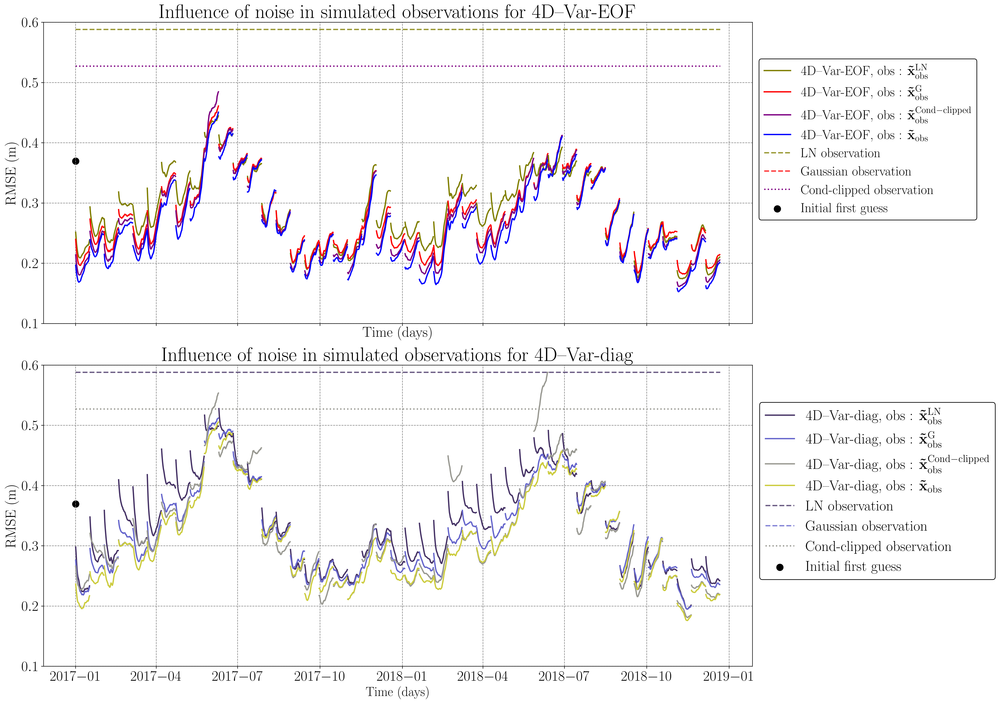

In [13]:
truth= np.load('14Avril/test_EOF_inf1_frac/x_truth.npy')
obs_gauss = np.load('14Avril/test_EOF_inf1_gauss/obs.npy')
obs_frac = np.load('1July/test_inf1_frac_EOF/obs.npy')
obs_clip = np.load('14Avril/test_EOF_inf1_frac_clip/obs.npy')

rmse_gauss = C*rmse(obs_gauss[:8*45], truth[::4])
rmse_frac = C*rmse(obs_frac[:8*45], truth[::4])
rmse_clip = C*rmse(obs_clip[:8*45], truth[::4])
#rmse_frac = rmse(obs_4Dvar_fracnoise[:8*16], truth[::4])
sit_input = np.load('17Avril/diagB_frac_inf1/sit_input.npy')*mask.squeeze()
def rmse2(x, y):
    return np.sqrt(np.mean((x - y)**2))
N = np.arange(36*5+1)/2
N2 = np.arange(20*56 + 1)/2
plt.rcParams['axes.facecolor'] = 'xkcd:white'
cmap_EOF = plt.get_cmap('brg_r')
colors_EOF = cmap_EOF(np.linspace(0,1,9))

cmap_diag = plt.get_cmap('gist_stern')
colors_diag = cmap_diag(np.linspace(0,1,11))
fig, (ax1, ax2) = plt.subplots(2, 1, figsize = (25,15), sharex = True, sharey = True)
ax1.hlines(rmse_frac.mean(), time[0],time[32*45], color = colors_EOF[2], label = 'LN observation', alpha = 0.8, linewidth = 2, linestyle = 'dashed')
ax1.hlines(rmse_gauss.mean(), time[0],time[32*45], color = colors_EOF[4], label = 'Gaussian observation', alpha = 0.8, linewidth = 2, linestyle = 'dashed')
ax1.hlines(rmse_clip.mean(), time[0],time[32*45], color = colors_EOF[6], label = 'Cond-clipped observation', alpha = 1, linewidth = 2, linestyle = 'dotted')

i =0
ax1.plot(time[32*i:32*i+32], C*EOF_frac_rmse[32*i:32*i+32], color = colors_EOF[2], label = '4D--Var-EOF, obs : $\mathbf{\\tilde{x}}_\mathrm{obs}^{\mathrm{LN}}$', linewidth = 2)
ax1.plot(time[32*i:32*i+32], C*EOF_gauss_rmse[32*i:32*i+32], color = colors_EOF[4], label = '4D--Var-EOF, obs : $\mathbf{\\tilde{x}}_\mathrm{obs}^{\mathrm{G}}$', linewidth = 2)
ax1.plot(time[32*i:32*i+32], C*EOF_clip_rmse[32*i:32*i+32], color = colors_EOF[6], label = '4D--Var-EOF, obs : $\mathbf{\\tilde{x}}_\mathrm{obs}^{\mathrm{Cond-clipped}}$', linewidth = 2)
ax1.plot(time[32*i:32*i+32], C*EOF_nonoise_rmse[32*i:32*i+32], color = colors_EOF[8], label = '4D--Var-EOF, obs : $\mathbf{\\tilde{x}}_\mathrm{obs}$', linewidth = 2)

for i in range(1, 45):
    ax1.plot(time[32*i:32*i+32], C*EOF_frac_rmse[32*i:32*i+32], color = colors_EOF[2], linewidth = 2)
    ax1.plot(time[32*i:32*i+32], C*EOF_gauss_rmse[32*i:32*i+32], color = colors_EOF[4], linewidth = 2)
    ax1.plot(time[32*i:32*i+32], C*EOF_clip_rmse[32*i:32*i+32], color = colors_EOF[6], linewidth = 2)
    ax1.plot(time[32*i:32*i+32], C*EOF_nonoise_rmse[32*i:32*i+32], color = colors_EOF[8], linewidth = 2)
ax1.scatter(time[0], rmse2(sit_input, truth[0]*mask.squeeze()), label = 'Initial first guess', color = 'k')

    
ax1.legend(fontsize=20 , bbox_to_anchor=(1, 0.9))

#plt.ylim([0, 2])
ax1.set_xlabel('Time (days)', fontsize = 22)
ax1.set_ylabel('RMSE (m)', fontsize = 22)
ax1.set_title('Influence of noise in simulated observations for 4D--Var-EOF', fontsize = 30)

ax2.hlines(rmse_frac.mean(), time[0],time[32*45], color = colors_diag[2], label = 'LN observation', alpha = 0.8, linewidth = 2, linestyle = 'dashed')
ax2.hlines(rmse_gauss.mean(), time[0],time[32*45], color = colors_diag[4], label = 'Gaussian observation', alpha = 0.8, linewidth = 2, linestyle = 'dashed')
ax2.hlines(rmse_clip.mean(), time[0],time[32*45], color = colors_diag[6], label = 'Cond-clipped observation', alpha = 1, linewidth = 2, linestyle = 'dotted')

i =0
ax2.plot(time[32*i:32*i+32], C*diagB_frac_rmse[32*i:32*i+32], color = colors_diag[2], label = '4D--Var-diag, obs : $\mathbf{\\tilde{x}}_\mathrm{obs}^{\mathrm{LN}}$', linewidth = 2)
ax2.plot(time[32*i:32*i+32], C*diagB_gauss_rmse[32*i:32*i+32], color = colors_diag[4], label = '4D--Var-diag, obs : $\mathbf{\\tilde{x}}_\mathrm{obs}^{\mathrm{G}}$', linewidth = 2)
ax2.plot(time[32*i:32*i+32], C*diagB_clip_rmse[32*i:32*i+32], color = colors_diag[6], label = '4D--Var-diag, obs : $\mathbf{\\tilde{x}}_\mathrm{obs}^{\mathrm{Cond-clipped}}$', linewidth = 2)
ax2.plot(time[32*i:32*i+32], C*diagB_nonoise_rmse[32*i:32*i+32], color = colors_diag[8], label = '4D--Var-diag, obs : $\mathbf{\\tilde{x}}_\mathrm{obs}$', linewidth = 2)

for i in range(1, 45):
    ax2.plot(time[32*i:32*i+32], C*diagB_frac_rmse[32*i:32*i+32], color = colors_diag[2], linewidth = 2)
    ax2.plot(time[32*i:32*i+32], C*diagB_gauss_rmse[32*i:32*i+32], color = colors_diag[4], linewidth = 2)
    ax2.plot(time[32*i:32*i+32], C*diagB_clip_rmse[32*i:32*i+32], color = colors_diag[6], linewidth = 2)
    ax2.plot(time[32*i:32*i+32], C*diagB_nonoise_rmse[32*i:32*i+32], color = colors_diag[8], linewidth = 2)
ax2.scatter(time[0], rmse2(sit_input, truth[0]*mask.squeeze()), label = 'Initial first guess', color = 'k')

    
ax2.legend(fontsize=22, bbox_to_anchor=(1, 0.9))
ax1.tick_params(axis='both', which='major', labelsize=22)  # For major ticks
ax2.tick_params(axis='both', which='major', labelsize=22)  # For major ticks
#ax1.set_xticklabels(ax1.get_xticks(), fontsize=18)
#ax1.set_yticklabels(ax1.get_yticks(), fontsize=18)
#ax2.set_xticklabels(ax2.get_xticks(), fontsize=18)
#ax2.set_yticklabels(ax2.get_yticks(), fontsize=18)


ax2.set_ylim([0.1, 0.6])

ax1.set_ylim([0.1, 0.6])
ax2.set_xlabel('Time (days)', fontsize = 20)
ax2.set_ylabel('RMSE (m)', fontsize = 22)
ax2.set_title('Influence of noise in simulated observations for 4D--Var-diag', fontsize = 30)
fig.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust the rect parameter if needed

plt.savefig('fig04.pdf', dpi = 300, bbox_inches='tight')


(1440, 128, 128)
(1440, 128, 128)
(43, 90)


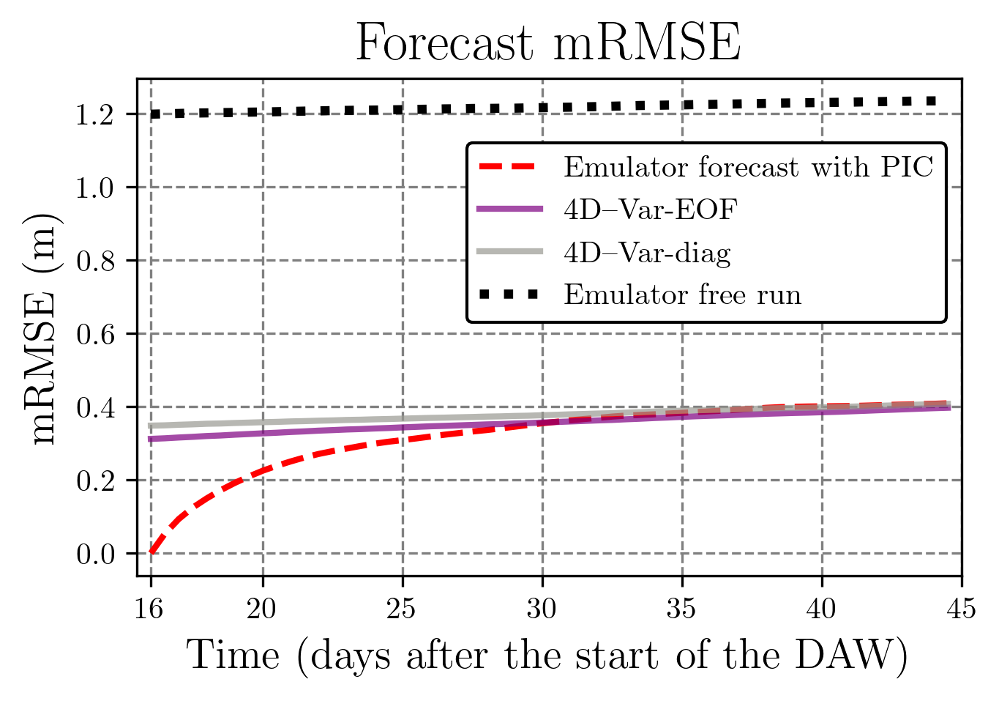

In [15]:
rmse_free = np.load('EOF_obs_op_nonoise/free_rmse_end_RMSE.npy')
rmse_free_start = np.load('1July/test_inf1_frac_EOF/free_rmse.npy')
rmse_free_mid = np.load('1July/test_inf1_frac_EOF/rmse_analysis_mid.npy')

EOF_frac_rmse_long = np.load('1July/test_inf1_frac_EOF/rmse_analysis.npy')
diag_frac_rmse_long = np.load('1July/test_inf1_frac/rmse_analysis.npy')

long_rmse_free = np.load('long_free_cycle.npy')
rmse_long_free = rmse(long_rmse_free, truth)
print(np.shape(long_rmse_free))
print(np.shape(truth))
print(np.shape(EOF_frac_rmse_long))
cmap_EOF = plt.get_cmap('brg_r')
colors_EOF = cmap_EOF(np.linspace(0,1,9))

rmse_long_cycles = np.zeros((43, 90))
for i in range(43):
    rmse_long_cycles[i] = rmse_long_free[32*i:32*i + 90]
N = np.arange(36*5+1)/2
N2 = np.arange(20*56 + 1)/2

plt.rcParams['axes.facecolor'] = 'none'
cmap = plt.get_cmap('cmo.thermal')
colors = cmap(np.linspace(0,1,5))
fig = plt.figure(figsize=(8, 3))
gs = mpl.gridspec.GridSpec(1, 2, width_ratios=[2, 1])

#ax1 = brokenaxes(ylims=((0,0.6), (1.1, 1.3)), hspace=0.05)  # Specify y-axis ranges and spacing

# Create subplots with different sizes
ax1 = plt.subplot(gs[0, 0])  # Subplot in the upper left corner
#ax2 = plt.subplot(gs[0, 1])  # Subplot in the upper right corner
ax1.plot(N[32:90], C*rmse_free[:,:90-32].mean(axis = 0), color = 'red', linewidth = 2, label = "Emulator forecast with PIC", linestyle = 'dashed')

#ax1.hlines(rmse_gauss.mean(), time[0],time[32*35], color = colors[5], label = 'gaussian observation', alpha = 0.8, linewidth = 2, linestyle = 'dashed')
N_start =  34*16
#ax1.plot(N[:32], C*EOF_frac_rmse_long[23:,:32].mean(axis = (0)), color = colors_EOF[6], linewidth = 3, label = "4D--Var-EOF")
ax1.plot(N[32:90],C*EOF_frac_rmse_long[23:,32:].mean(axis = (0)), color = colors_EOF[6], linewidth = 2, label = "4D--Var-EOF", alpha = 0.7)

#ax1.plot(N[:32], C*diag_frac_rmse_long[23:,:32].mean(axis = (0)), color = colors_diag[6], linewidth = 3, label = "4D--Var-diag")
ax1.plot(N[32:90],C*diag_frac_rmse_long[23:,32:].mean(axis = (0)), color = colors_diag[6], linewidth = 2, label = "4D--Var-diag", alpha = 0.7)

ax1.plot(N[32:90], C*rmse_long_cycles[23:,32:90].mean(axis = 0), color = 'k', linewidth = 3, label = "Emulator free run", linestyle = 'dotted')

#ax1.plot(N[32:90],rmse_free[:,32:].mean(axis = 0), color = 'red')

#ax1.plot(time[32*i+ N_start:32*i+90+ N_start], rmse_1[i], color = 'k', linewidth =  1)
#ax1.plot(time[32*i+ N_start:32*i+90+ N_start], rmse_free[i], color = 'red', linewidth =  1)
#ax1.fill_between(N[32:90], C*EOF_frac_rmse_long[23:, 32:90].mean(axis = 0)-C*EOF_frac_rmse_long[23:,32:90].std(axis = (0)),C*EOF_frac_rmse_long[23:,32:90].mean(axis = (0))+C*EOF_frac_rmse_long[23:,32:90].std(axis = (0)), alpha = 0.2, color = colors_EOF[6])

#ax1.fill_between(N[32:90], C*diag_frac_rmse_long[23:,32:90].mean(axis = (0))-C*diag_frac_rmse_long[23:,32:90].std(axis = (0)),C*diag_frac_rmse_long[23:,32:90].mean(axis = (0))+C*diag_frac_rmse_long[23:,32:90].std(axis = (0)), alpha = 0.2, color = colors_diag[6])

ax1.legend(fontsize = 10, loc = 'upper right',bbox_to_anchor=(1,0.9))
ax1.tick_params(axis='both', labelsize=10)  # Major ticks


# Set y-axis limits to simulate the skip

ax1.set_xlabel('Time (days after the start of the DAW)', fontsize = 14)
ax1.set_ylabel('mRMSE (m)', fontsize = 14)
#ax2 = ax1.twinx()
#ax2.plot(N[32:90], np.abs(EOF_frac_rmse_long[23:,32:90].mean(axis = (0)))/rmse_long_cycles[23:,32:90].mean(axis = 0), color =  colors_EOF[6], linewidth = 3, label = "4D--Var-EOF")
#ax2.plot(N[32:90], np.abs(diag_frac_rmse_long[23:,32:90].mean(axis = (0)))/rmse_long_cycles[23:,32:90].mean(axis = 0), color = colors_diag[6], linewidth = 3, label = "4D--Var-diag")
#ax2.legend(fontsize = 14)
#ax2.set_ylabel('Ratio $\mathbf{x}_{\mathrm{a}}$/$\mathbf{x}_{\mathrm{free-run}}$')
#ax2.set_title('')
#ax2.set_xlabel('Time (days)')
ax1.set_xlim([15.5, 45])
ax1.set_xticks([16,20,25,30,35,40,45])
ax1.set_title('Forecast mRMSE', fontsize = 18, color = 'k')
plt.savefig('fig03.pdf', dpi = 300, bbox_inches='tight')


In [16]:
print((C*rmse_free[21:,-1] - C*EOF_frac_rmse_long[23:,-1]).mean())

0.01178407728884262


In [17]:
rmse_free = np.load('EOF_obs_op_nonoise/free_rmse_end_RMSE.npy')
print(np.shape(rmse_free_start))

(1440,)


In [18]:
print(((C*EOF_frac_rmse_long[1:,0]-C*EOF_frac_rmse_long[0:-1,32])).mean())

-0.019188039756942155


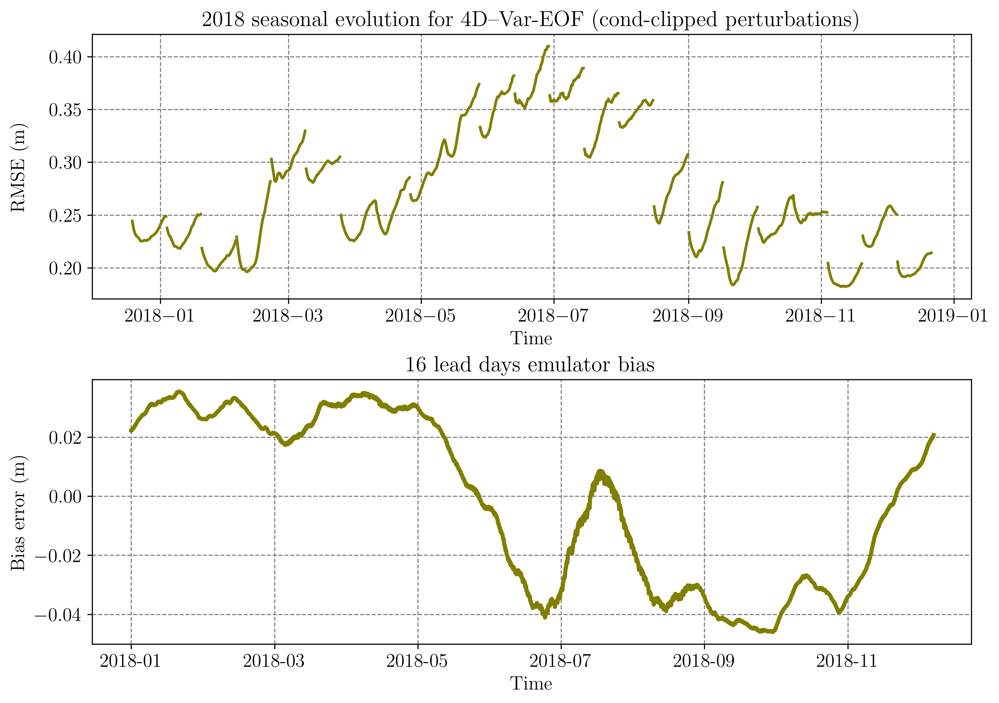

In [19]:
from matplotlib.colors import LogNorm
#plt.style.use('ggplot')
from copy import copy

import numpy.matlib
plt.rcParams['axes.facecolor'] = 'xkcd:white'

num_fine = 1300
bias = C*np.load('clip_cycle_1300_bias_mean.npy')
#print(np.shape(bias))
x = np.arange(0,1300)
#Y = bias.T
#num_series = 30
#x_fine = np.linspace(x.min(), x.max(), num_fine)
#y_fine = np.empty((num_series, num_fine), dtype=float)

#for i in range(num_series):
   
 #   y_fine[i, :] = np.interp(x_fine, x, Y.T[:, i])
#y_fine = y_fine.flatten()
#x_fine = np.matlib.repmat(x_fine, num_series, 1).flatten()


fig, (ax1, ax2) = plt.subplots(2,1, figsize=(10, 7), constrained_layout=True)

#ax1.hlines(rmse_gauss.mean(), time[0],time[32*21], color = colors_EOF[2], label = 'Gaussian observation', alpha = 1, linewidth = 2, linestyle = 'dotted')

i =22
ax1.plot(time[32*i:32*i+32], C*EOF_gauss_rmse[32*i:32*i+32], color = colors_EOF[2], label = '4D--Var-EOF$', linewidth = 2)

for i in range(23, 45):
    ax1.plot(time[32*i:32*i+32], C*EOF_gauss_rmse[32*i:32*i+32], color = colors_EOF[2], linewidth = 2)
    
#ax1.legend()

ax1.set_xlabel('Time', fontsize = 14)
ax1.set_ylabel('RMSE (m)', fontsize = 14)
ax1.set_title('2018 seasonal evolution for 4D--Var-EOF (cond-clipped perturbations)', fontsize = 16)


#cmap = copy(cmocean.cm.rain)
#plt.ylim([-1,1])
#cmap.set_bad(cmap(0))
#h, xedges, yedges = np.histogram2d(x_fine, y_fine, bins=[300, 300])
im2 = ax2.plot(bias[:,-1],color = colors_EOF[2])
#fig.colorbar(pcm, ax=ax2, label=" points", pad=0)
ax2.set_title("16 lead days emulator bias", fontsize = 16)
#N = 1.2
ax2.set_xticks(x[::29*8])
ax2.set_xlim([-63, 1360])
time_print = ['2018-01', '2018-03','2018-05','2018-07','2018-09','2018-11']

ax2.set_xticklabels(time_print)
ax2.set_xlabel('Time', fontsize = 14)
ax2.set_ylabel('Bias error (m)', fontsize = 14)

ax2.grid(True)
ax1.tick_params(axis='both', which='major', labelsize=14)  # Major ticks
ax2.tick_params(axis='both', which='major', labelsize=14)  # Major ticks
fig.align_ylabels()

plt.savefig('fig06.pdf', dpi = 300, bbox_inches='tight')


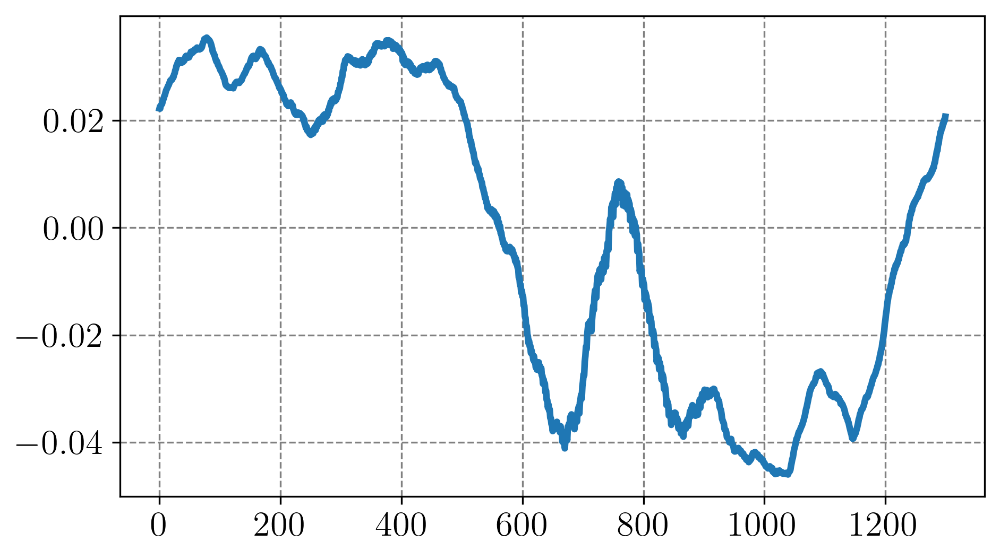

In [20]:
plt.plot(bias[:,-1])

/var/folders/6n/yk3tn78x6lj4hfylvhsqtsmh0000gn/T/ipykernel_22068/3561657644.py:72: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust 'rect' to account for the suptitle


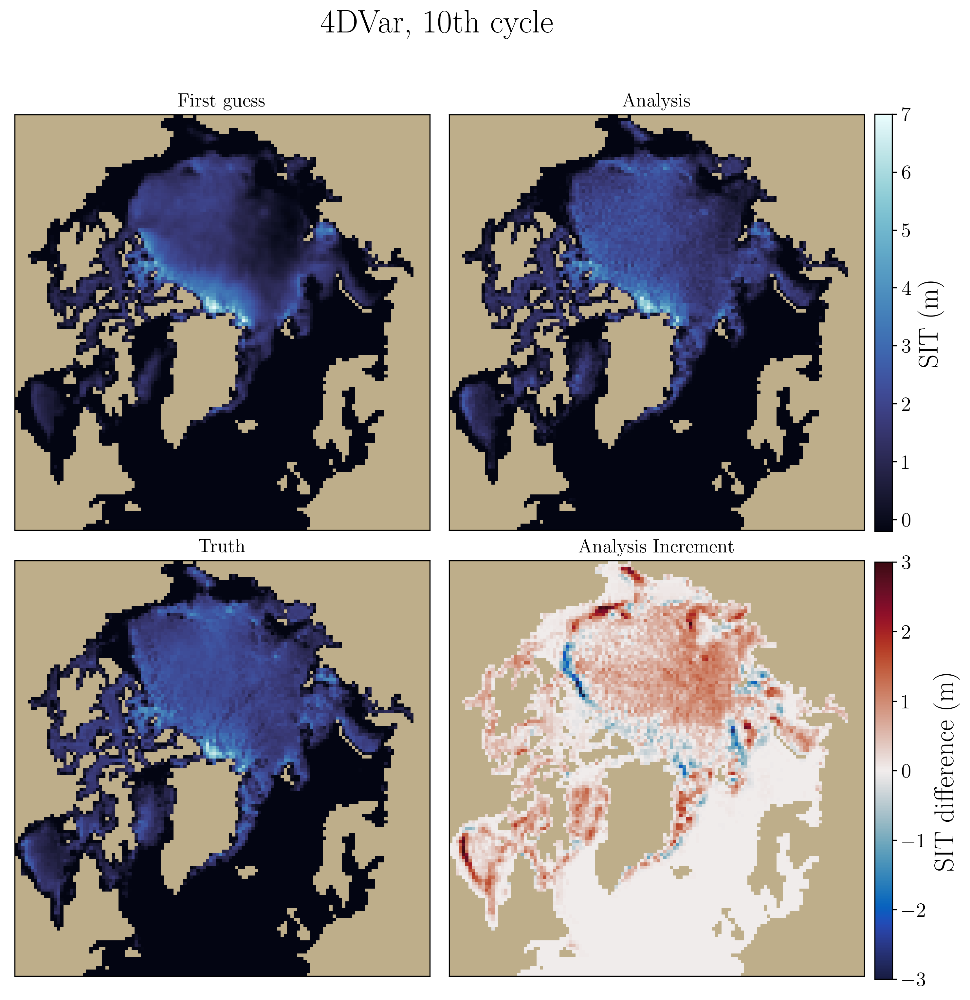

In [89]:
xana2 = np.load('14Avril/test_EOF_inf1_frac/state_10.npy')
xbar = np.load('mean_norm.npy').reshape(8871,1)
EOF = np.load('EOFs_y8_norm.npy')[:,:8871]
state = xbar + EOF@np.reshape(xana2, (8871,1))
state2D = np.zeros((128*128))
state2D[unflatten] = state.reshape(8871)
state2D1 = state2D.reshape((128,128))

xback2 = np.load('14Avril/test_EOF_inf1_frac/back_10.npy')
#xbar = np.load('EOF/mean.npy').reshape(8871,1)
#EOF = np.load('EOF/EOFs_y8.npy')[:,:7000]
#state = xbar + EOF@np.reshape(xback2, (7000,1))
state2D = np.zeros((128*128))
state2D[unflatten] = xback2.reshape(8871)
state2D2 = state2D.reshape((128,128))

plt.rcParams['axes.facecolor'] = 'xkcd:putty'

fig = plt.figure(figsize = (9,10.3))
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.4, hspace=0.4)
ax1 = plt.subplot2grid((2, 2), (0, 0))
ax2 = plt.subplot2grid((2, 2), (0, 1))
ax3 = plt.subplot2grid((2, 2), (1, 0))
ax4 = plt.subplot2grid((2, 2), (1, 1))                                    
ax1.set_title('First guess', fontsize = 14)
im1 = ax1.imshow(ma.masked_array(state2D2, mask = 1 - mask), origin = 'lower', cmap = cmocean.cm.ice, vmin = -0.2, vmax = 7)

ax1.grid(False)
ax1.set_xticks([])
ax1.set_yticks([])

ax2.set_title('Analysis', fontsize = 14)
im2 = ax2.imshow(ma.masked_array(state2D1, mask = 1 - mask), origin = 'lower', cmap = cmocean.cm.ice, vmin = -0.2, vmax = 7)
ax2.set_xticks([])
ax2.set_yticks([])

ax2.grid(False)

ax3.set_title('Truth', fontsize = 14)
im3 = ax3.imshow(ma.masked_array(truth[32*10].reshape((128,128)), mask = 1 - mask), origin = 'lower', cmap = cmocean.cm.ice, vmin = -0.2, vmax = 7)
ax3.set_xticks([])
ax3.set_yticks([])

ax3.grid(False)

ax4.set_title('Analysis Increment', fontsize = 14)
im4 = ax4.imshow(ma.masked_array( state2D1 - state2D2, mask = 1 - mask), origin = 'lower', cmap = cmocean.cm.balance, vmin = -3, vmax = 3)
ax4.grid(False)

ax4.set_xticks([])
ax4.set_yticks([])

#cbar_ax1 = fig.add_axes([0.48, 0.125, 0.02, 0.756])

#cb1 = fig.colorbar(im1, ax=[ax1, ax3], cax = cbar_ax1, aspect=18.5, pad=0)
#cb1.ax.tick_params(labelsize=15)

cbar_ax2 = fig.add_axes([0.995, 0.0225, 0.02, 0.412])

cb2 = fig.colorbar(im4, ax=[ax4], cax = cbar_ax2, aspect=18.5, pad=0)
cb2.ax.tick_params(labelsize=15)

cbar_ax3 = fig.add_axes([0.995, 0.465, 0.02, 0.412])

cb3 = fig.colorbar(im2, ax=[ax2], cax = cbar_ax3, aspect=18.5, pad=0)
cb3.ax.tick_params(labelsize=15)
cb3.set_label("SIT (m)")
cb2.set_label("SIT difference (m)")
#cb1.set_label("SIT (m)")
                                    
plt.suptitle('4DVar, 10th cycle', fontsize = 24)
fig.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust 'rect' to account for the suptitle

plt.savefig('fig05.pdf', dpi = 300,  bbox_inches='tight', pad_inches=0.1)

# CS2SMOS assimilation

(20, 18)


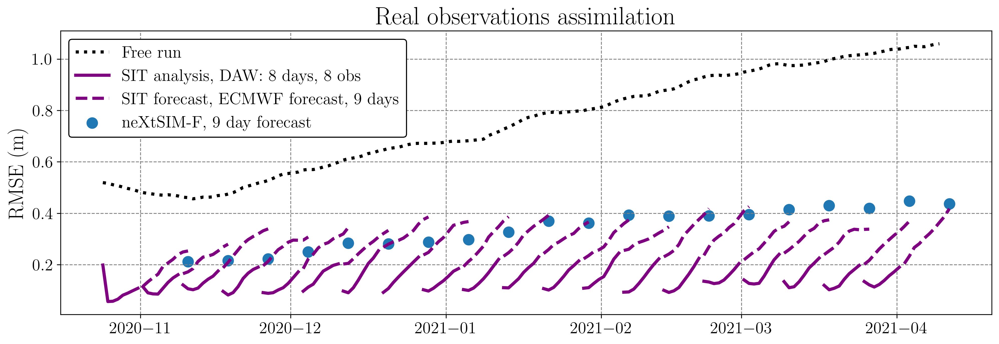

In [24]:
cmap_EOF = plt.get_cmap('brg_r')
colors_EOF = cmap_EOF(np.linspace(0,1,9))

sit_nextsim = np.zeros((20, 128, 128))

nextsimF_2020_11_10 = xr.open_dataset("sit_nextsimF/sit_nextsimF_2020_11_10.nc")
sit_nextsim[0] = nextsimF_2020_11_10.sithick.data[:12].mean(axis=0)

nextsimF_2020_11_18 = xr.open_dataset("sit_nextsimF/sit_nextsimF_2020_11_18.nc")
sit_nextsim[1] = nextsimF_2020_11_18.sithick.data[:12].mean(axis=0)

nextsimF_2020_11_26 = xr.open_dataset("sit_nextsimF/sit_nextsimF_2020_11_26.nc")
sit_nextsim[2] = nextsimF_2020_11_26.sithick.data[:12].mean(axis=0)

nextsimF_2020_12_04 = xr.open_dataset("sit_nextsimF/sit_nextsimF_2020_12_04.nc")
sit_nextsim[3] = nextsimF_2020_12_04.sithick.data[:12].mean(axis=0)

nextsimF_2020_12_12 = xr.open_dataset("sit_nextsimF/sit_nextsimF_2020_12_12.nc")
sit_nextsim[4] = nextsimF_2020_12_12.sithick.data[:12].mean(axis=0)

nextsimF_2020_12_20 = xr.open_dataset("sit_nextsimF/sit_nextsimF_2020_12_20.nc")
sit_nextsim[5] = nextsimF_2020_12_20.sithick.data[:12].mean(axis=0)

nextsimF_2020_12_28 = xr.open_dataset("sit_nextsimF/sit_nextsimF_2020_12_28.nc")
sit_nextsim[6] = nextsimF_2020_12_28.sithick.data[:12].mean(axis=0)

nextsimF_2021_01_05 = xr.open_dataset("sit_nextsimF/sit_nextsimF_2021_01_05.nc")
sit_nextsim[7] = nextsimF_2021_01_05.sithick.data[:12].mean(axis=0)

nextsimF_2021_01_13 = xr.open_dataset("sit_nextsimF/sit_nextsimF_2021_01_13.nc")
sit_nextsim[8] = nextsimF_2021_01_13.sithick.data[:12].mean(axis=0)

nextsimF_2021_01_21 = xr.open_dataset("sit_nextsimF/sit_nextsimF_2021_01_21.nc")
sit_nextsim[9] = nextsimF_2021_01_21.sithick.data[:12].mean(axis=0)

nextsimF_2021_01_29 = xr.open_dataset("sit_nextsimF/sit_nextsimF_2021_01_29.nc")
sit_nextsim[10] = nextsimF_2021_01_29.sithick.data[:12].mean(axis=0)

nextsimF_2021_02_06 = xr.open_dataset("sit_nextsimF/sit_nextsimF_2021_02_06.nc")
sit_nextsim[11] = nextsimF_2021_02_06.sithick.data[:12].mean(axis=0)

nextsimF_2021_02_14 = xr.open_dataset("sit_nextsimF/sit_nextsimF_2021_02_14.nc")
sit_nextsim[12] = nextsimF_2021_02_14.sithick.data[:12].mean(axis=0)

nextsimF_2021_02_22 = xr.open_dataset("sit_nextsimF/sit_nextsimF_2021_02_22.nc")
sit_nextsim[13] = nextsimF_2021_02_22.sithick.data[:12].mean(axis=0)

nextsimF_2021_03_02 = xr.open_dataset("sit_nextsimF/sit_nextsimF_2021_03_02.nc")
sit_nextsim[14] = nextsimF_2021_03_02.sithick.data[:12].mean(axis=0)

nextsimF_2021_03_10 = xr.open_dataset("sit_nextsimF/sit_nextsimF_2021_03_10.nc")
sit_nextsim[15] = nextsimF_2021_03_10.sithick.data[:12].mean(axis=0)

nextsimF_2021_03_18 = xr.open_dataset("sit_nextsimF/sit_nextsimF_2021_03_18.nc")
sit_nextsim[16] = nextsimF_2021_03_18.sithick.data[:12].mean(axis=0)

nextsimF_2021_03_26 = xr.open_dataset("sit_nextsimF/sit_nextsimF_2021_03_26.nc")
sit_nextsim[17] = nextsimF_2021_03_26.sithick.data[:12].mean(axis=0)

nextsimF_2021_04_03 = xr.open_dataset("sit_nextsimF/sit_nextsimF_2021_04_03.nc")
sit_nextsim[18] = nextsimF_2021_04_03.sithick.data[:12].mean(axis=0)

nextsimF_2021_04_11 = xr.open_dataset("sit_nextsimF/sit_nextsimF_2021_04_11.nc")
sit_nextsim[19] = nextsimF_2021_04_11.sithick.data[:12].mean(axis=0)

im_truth = np.load('11July/test/x_truth.npy')
rmse_nextsimF = C*rmse(im_truth[17::8], sit_nextsim)

rmse_free = C*np.load('11July/test/free_rmse.npy')
rmse_4d_forecast  = C*np.load('11July/test/rmse_analysis.npy')
rmse_ana = C*np.load('11July/test/rmse.npy')
rmse_free_obs = C*np.load('11July/test/long_free_rmse.npy')
print(np.shape(rmse_free_obs))
u10 = xr.open_dataset("sit_obs_2021.nc")
time_cs2smos = u10.time[6:]
plt.rcParams['axes.facecolor'] = 'xkcd:white'

plt.figure(figsize = (16, 5))

#plt.plot(time[:-2], rmse_nextsimF, label = "neXtSIM-F", linestyle = 'dotted', color='k')
plt.plot(time_cs2smos[:-3], rmse_free, label = "Free run", color = 'k', linestyle = 'dotted')
plt.title('Real observations assimilation')
plt.scatter(time_cs2smos[17:17+8*20:8],rmse_nextsimF, label = 'neXtSIM-F, 9 day forecast')
#plt.hlines(rmse_persistence_8.mean(),time[0], time[-1],  color = 'green', linestyle = 'solid', label = 'CS2SMOS persistence, 8 days')
#plt.hlines(rmse_persistence_16.mean(),time[0], time[-1],  color = 'green', linestyle = 'dashed', label = 'CS2SMOS persistence, 16 days')


i=0
plt.plot(time_cs2smos[8*i:8*i + 8], rmse_4d_forecast[0,:8], color = colors_EOF[6], label = 'SIT analysis, DAW: 8 days, 8 obs')
plt.plot(time_cs2smos[8*i+8:8*i + 18], rmse_4d_forecast[0,8:], color = colors_EOF[6], linestyle = 'dashed', label = 'SIT forecast, ECMWF forecast, 9 days')

for i in range(1, 20):
 #   print(i)
    plt.plot(time_cs2smos[8*i:8*i + 8], rmse_4d_forecast[i,:8], color = colors_EOF[6])
    plt.plot(time_cs2smos[8*i+8:8*i + 18], rmse_4d_forecast[i,8:], color = colors_EOF[6], linestyle = 'dashed')

    #plt.plot(time[8*i+8:8*i + 16], rmse_free_forecast[i,8:], color = colors_EOF[1], linestyle = 'dashed')

#for i in range(10, 11):
 #   print(i)
 #   plt.plot(time[8*i:8*i + 8], rmse_4d_analysis[8*i:8*i + 8], color = colors_EOF[6])
plt.legend(loc = 'upper left')

plt.ylabel('RMSE (m)')
plt.savefig('fig07.pdf', bbox_inches='tight')
#plt.ylim([0,1.2])

In [209]:
total = rmse_4d_forecast[:,8:-2].flatten()
print((total-rmse_free[8:]).mean())

print(rmse_nextsimF.mean())
print(rmse_4d_forecast[:,-1].mean())

-0.4901537358439363
0.3410101220480526
0.3593682751706986


(20, 18)


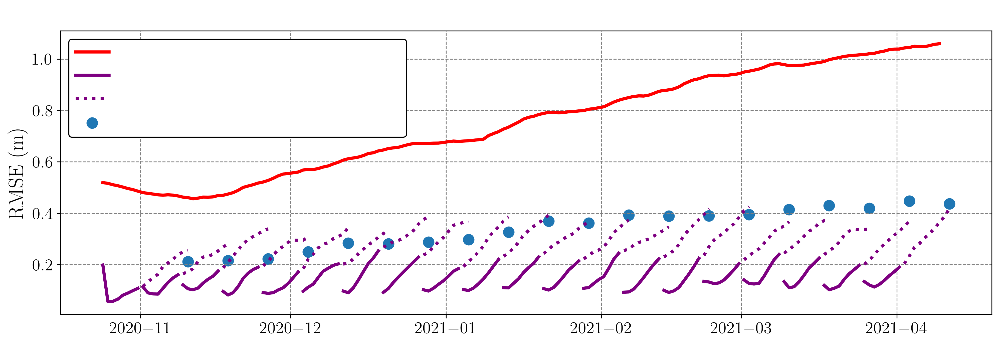

In [210]:
cmap_EOF = plt.get_cmap('brg_r')
colors_EOF = cmap_EOF(np.linspace(0,1,9))

sit_nextsim = np.zeros((20, 128, 128))

nextsimF_2020_11_10 = xr.open_dataset("sit_nextsimF/sit_nextsimF_2020_11_10.nc")
sit_nextsim[0] = nextsimF_2020_11_10.sithick.data[:12].mean(axis=0)

nextsimF_2020_11_18 = xr.open_dataset("sit_nextsimF/sit_nextsimF_2020_11_18.nc")
sit_nextsim[1] = nextsimF_2020_11_18.sithick.data[:12].mean(axis=0)

nextsimF_2020_11_26 = xr.open_dataset("sit_nextsimF/sit_nextsimF_2020_11_26.nc")
sit_nextsim[2] = nextsimF_2020_11_26.sithick.data[:12].mean(axis=0)

nextsimF_2020_12_04 = xr.open_dataset("sit_nextsimF/sit_nextsimF_2020_12_04.nc")
sit_nextsim[3] = nextsimF_2020_12_04.sithick.data[:12].mean(axis=0)

nextsimF_2020_12_12 = xr.open_dataset("sit_nextsimF/sit_nextsimF_2020_12_12.nc")
sit_nextsim[4] = nextsimF_2020_12_12.sithick.data[:12].mean(axis=0)

nextsimF_2020_12_20 = xr.open_dataset("sit_nextsimF/sit_nextsimF_2020_12_20.nc")
sit_nextsim[5] = nextsimF_2020_12_20.sithick.data[:12].mean(axis=0)

nextsimF_2020_12_28 = xr.open_dataset("sit_nextsimF/sit_nextsimF_2020_12_28.nc")
sit_nextsim[6] = nextsimF_2020_12_28.sithick.data[:12].mean(axis=0)

nextsimF_2021_01_05 = xr.open_dataset("sit_nextsimF/sit_nextsimF_2021_01_05.nc")
sit_nextsim[7] = nextsimF_2021_01_05.sithick.data[:12].mean(axis=0)

nextsimF_2021_01_13 = xr.open_dataset("sit_nextsimF/sit_nextsimF_2021_01_13.nc")
sit_nextsim[8] = nextsimF_2021_01_13.sithick.data[:12].mean(axis=0)

nextsimF_2021_01_21 = xr.open_dataset("sit_nextsimF/sit_nextsimF_2021_01_21.nc")
sit_nextsim[9] = nextsimF_2021_01_21.sithick.data[:12].mean(axis=0)

nextsimF_2021_01_29 = xr.open_dataset("sit_nextsimF/sit_nextsimF_2021_01_29.nc")
sit_nextsim[10] = nextsimF_2021_01_29.sithick.data[:12].mean(axis=0)

nextsimF_2021_02_06 = xr.open_dataset("sit_nextsimF/sit_nextsimF_2021_02_06.nc")
sit_nextsim[11] = nextsimF_2021_02_06.sithick.data[:12].mean(axis=0)

nextsimF_2021_02_14 = xr.open_dataset("sit_nextsimF/sit_nextsimF_2021_02_14.nc")
sit_nextsim[12] = nextsimF_2021_02_14.sithick.data[:12].mean(axis=0)

nextsimF_2021_02_22 = xr.open_dataset("sit_nextsimF/sit_nextsimF_2021_02_22.nc")
sit_nextsim[13] = nextsimF_2021_02_22.sithick.data[:12].mean(axis=0)

nextsimF_2021_03_02 = xr.open_dataset("sit_nextsimF/sit_nextsimF_2021_03_02.nc")
sit_nextsim[14] = nextsimF_2021_03_02.sithick.data[:12].mean(axis=0)

nextsimF_2021_03_10 = xr.open_dataset("sit_nextsimF/sit_nextsimF_2021_03_10.nc")
sit_nextsim[15] = nextsimF_2021_03_10.sithick.data[:12].mean(axis=0)

nextsimF_2021_03_18 = xr.open_dataset("sit_nextsimF/sit_nextsimF_2021_03_18.nc")
sit_nextsim[16] = nextsimF_2021_03_18.sithick.data[:12].mean(axis=0)

nextsimF_2021_03_26 = xr.open_dataset("sit_nextsimF/sit_nextsimF_2021_03_26.nc")
sit_nextsim[17] = nextsimF_2021_03_26.sithick.data[:12].mean(axis=0)

nextsimF_2021_04_03 = xr.open_dataset("sit_nextsimF/sit_nextsimF_2021_04_03.nc")
sit_nextsim[18] = nextsimF_2021_04_03.sithick.data[:12].mean(axis=0)

nextsimF_2021_04_11 = xr.open_dataset("sit_nextsimF/sit_nextsimF_2021_04_11.nc")
sit_nextsim[19] = nextsimF_2021_04_11.sithick.data[:12].mean(axis=0)

im_truth = np.load('11July/test/x_truth.npy')
rmse_nextsimF = C*rmse(im_truth[17::8], sit_nextsim)

rmse_free = C*np.load('11July/test/free_rmse.npy')
rmse_4d_forecast  = C*np.load('11July/test/rmse_analysis.npy')
rmse_ana = C*np.load('11July/test/rmse.npy')
rmse_free_obs = C*np.load('11July/test/long_free_rmse.npy')
print(np.shape(rmse_free_obs))
u10 = xr.open_dataset("sit_obs_2021.nc")
time_cs2smos = u10.time[6:]
plt.rcParams['axes.facecolor'] = 'none'

plt.figure(figsize = (16, 5))

#plt.plot(time[:-2], rmse_nextsimF, label = "neXtSIM-F", linestyle = 'dotted', color='k')
plt.plot(time_cs2smos[:-3], rmse_free, label = "Free run", linestyle = 'solid', color = 'red')
plt.title('Real observations assimilation', color = 'white')
plt.scatter(time_cs2smos[17:17+8*20:8],rmse_nextsimF, label = 'neXtSIM-F, 9 day forecast')
#plt.hlines(rmse_persistence_8.mean(),time[0], time[-1],  color = 'green', linestyle = 'solid', label = 'CS2SMOS persistence, 8 days')
#plt.hlines(rmse_persistence_16.mean(),time[0], time[-1],  color = 'green', linestyle = 'dashed', label = 'CS2SMOS persistence, 16 days')


i=0
plt.plot(time_cs2smos[8*i:8*i + 8], rmse_4d_forecast[0,:8], color = colors_EOF[6], label = 'SIT analysis, DAW: 8 days, 8 obs')
plt.plot(time_cs2smos[8*i+8:8*i + 18], rmse_4d_forecast[0,8:], color = colors_EOF[6], linestyle = 'dotted', label = 'SIT forecast, ECMWF forecast, 9 days')

for i in range(1, 20):
 #   print(i)
    plt.plot(time_cs2smos[8*i:8*i + 8], rmse_4d_forecast[i,:8], color = colors_EOF[6])
    plt.plot(time_cs2smos[8*i+8:8*i + 18], rmse_4d_forecast[i,8:], color = colors_EOF[6], linestyle = 'dotted')

    #plt.plot(time[8*i+8:8*i + 16], rmse_free_forecast[i,8:], color = colors_EOF[1], linestyle = 'dashed')

#for i in range(10, 11):
 #   print(i)
 #   plt.plot(time[8*i:8*i + 8], rmse_4d_analysis[8*i:8*i + 8], color = colors_EOF[6])
plt.legend(loc = 'upper left', labelcolor = 'white')

plt.ylabel('RMSE (m)')
plt.savefig('fig07.pdf', bbox_inches='tight')
#plt.ylim([0,1.2])

In [16]:
print((rmse_free/rmse_ana).mean())

5.571644301170293


In [25]:
x_analysis_truth = np.zeros((20, 18, 128, 128))
for i in range(20):
    x_analysis_truth[i] = im_truth[i*8:i*8 + 18]
x_4D = np.load('11July/test/x_analysis_forecast.npy')
x_free = np.load('11July/test/x_free.npy')

print(np.shape(x_free))
print(np.shape(im_truth[6:-3]))

(168, 128, 128)
(168, 128, 128)


In [26]:
cs2smos_obs = xr.open_dataset('2021_input.nc')
cs2smos_sit = cs2smos_obs.analysis_sea_ice_thickness.data[7::2,0]
cs2smos_sit = np.nan_to_num(cs2smos_sit, nan = -0.4982132613658905).reshape((177, 128, 128))
print(np.shape(cs2smos_sit))

def rmse(x, y):
    return np.sqrt(np.mean((x - y)**2, axis = (1, 2)))

threshold = 0.1

def reverse_normalize_input(x):
    return mean_input + x * std_input

def IIEE_4D(truth, pred):
    store = np.zeros(17)
    threshold = 0.1
    for i in range(17):
        class_above_pred = [pred[i]>threshold][0]*1
        class_above_truth = [truth[i]>threshold][0]*1
        Over = np.sum([(class_above_pred - class_above_truth) > 0][0])
        Under = np.sum([(class_above_truth - class_above_pred) > 0][0])


        IIEE_value = Over + Under
        store[i-1] = IIEE_value
    return store

def IIEE_free_run(truth, pred):
    store = np.zeros(168)
    threshold = 0.1
    for i in range(168):
        class_above_pred = [pred[i]>threshold][0]*1
        class_above_truth = [truth[i]>threshold][0]*1
        Over = np.sum([(class_above_pred - class_above_truth) > 0][0])
        Under = np.sum([(class_above_truth - class_above_pred) > 0][0])


        IIEE_value = Over + Under
        store[i-1] = IIEE_value
    return store
def IIEE_nextsimF(truth, pred):
    store = np.zeros(20)
    threshold = 0.1
    for i in range(20):
        class_above_pred = [pred[i]>threshold][0]*1
        class_above_truth = [truth[i]>threshold][0]*1
        Over = np.sum([(class_above_pred - class_above_truth) > 0][0])
        Under = np.sum([(class_above_truth - class_above_pred) > 0][0])


        IIEE_value = Over + Under
        store[i-1] = IIEE_value
    return store

def bias(x, y):
    return np.mean((x - y) , axis = (1, 2))

rmse_persistence = rmse(cs2smos_sit[0:-16], cs2smos_sit[16:])
rmse_persistence2 = rmse(cs2smos_sit[0:-8], cs2smos_sit[8:])

iiee_4dvar = np.zeros((20,17))
bias_4dvar = np.zeros((20,17))

for i in range(20):
    iiee_4dvar[i] = IIEE_4D(x_4D[i,:-1], x_analysis_truth[i,:-1])/8871
    bias_4dvar[i] = bias(x_4D[i,:-1], x_analysis_truth[i,:-1])
iiee_nextsimF = IIEE_nextsimF(im_truth[17::8], sit_nextsim)/8871
iiee_free_run = IIEE_free_run(im_truth[6:-3], x_free)/8871

bias_nextsimF = bias(im_truth[17::8], sit_nextsim)
bias_free_run = bias(im_truth[6:-3], x_free)

(177, 128, 128)


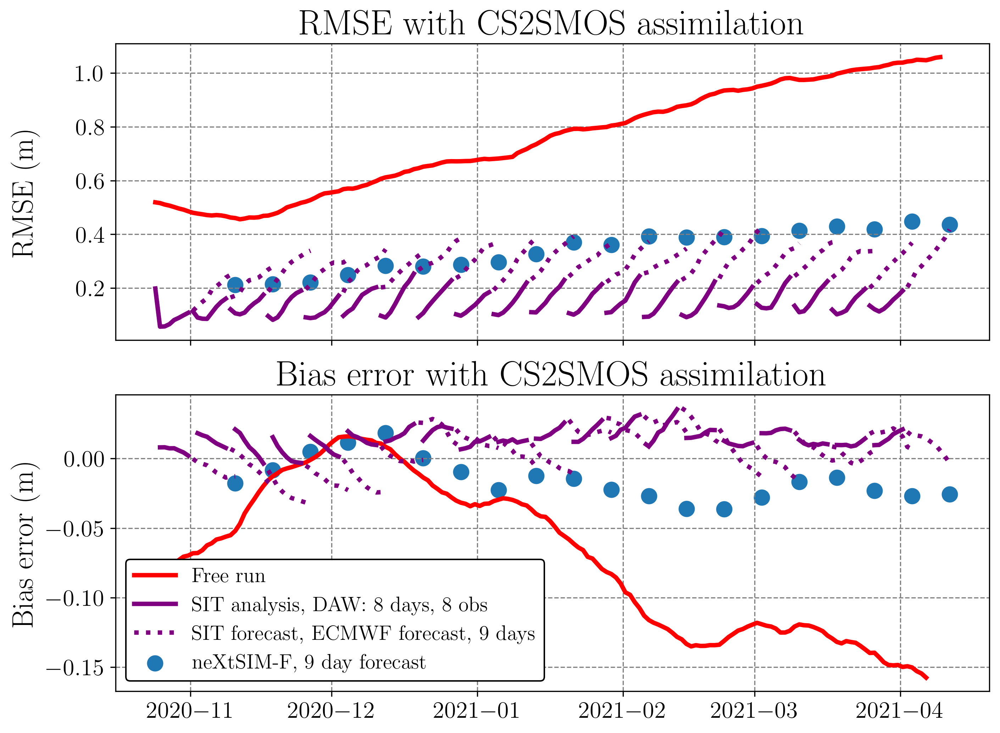

In [214]:
plt.rcParams['axes.facecolor'] = 'none'

fig, (ax1, ax2) = plt.subplots(2, 1, figsize = (10, 7), sharex=True)
ax2.plot(time_cs2smos[:-6],bias_free_run[1:-2], label = "Free run", linestyle = 'solid', color = 'red')
ax2.scatter(time_cs2smos[17::8],bias_nextsimF, label = 'neXtSIM-F, 9 day forecast')
i=0
ax2.plot(time_cs2smos[8*i+1:8*i + 8], bias_4dvar[0,1:8], color = colors_EOF[6], label = 'SIT analysis, DAW: 8 days, 8 obs')
ax2.plot(time_cs2smos[8*i+8:8*i + 18], bias_4dvar[0,8:], color = colors_EOF[6], linestyle = 'dotted', label = 'SIT forecast, ECMWF forecast, 9 days')

for i in range(1, 20):
 #   print(i)
    ax2.plot(time_cs2smos[8*i+1:8*i + 8], bias_4dvar[i,1:8], color = colors_EOF[6])
    ax2.plot(time_cs2smos[8*i+8:8*i + 18], bias_4dvar[i,8:], color = colors_EOF[6], linestyle = 'dotted')


i=0
ax1.plot(time_cs2smos[:-3], rmse_free, label = "Free run", linestyle = 'solid', color = 'red')
ax1.set_title('Real observations assimilation', color = 'k')
ax1.scatter(time_cs2smos[17:17+8*20:8],rmse_nextsimF, label = 'neXtSIM-F, 9 day forecast')
#plt.hlines(rmse_persistence_8.mean(),time[0], time[-1],  color = 'green', linestyle = 'solid', label = 'CS2SMOS persistence, 8 days')
#plt.hlines(rmse_persistence_16.mean(),time[0], time[-1],  color = 'green', linestyle = 'dashed', label = 'CS2SMOS persistence, 16 days')


i=0
ax1.plot(time_cs2smos[8*i:8*i + 8], rmse_4d_forecast[0,:8], color = colors_EOF[6], label = 'SIT analysis, DAW: 8 days, 8 obs')
ax1.plot(time_cs2smos[8*i+8:8*i + 18], rmse_4d_forecast[0,8:], color = colors_EOF[6], linestyle = 'dotted', label = 'SIT forecast, ECMWF forecast, 9 days')

for i in range(1, 20):
 #   print(i)
    ax1.plot(time_cs2smos[8*i:8*i + 8], rmse_4d_forecast[i,:8], color = colors_EOF[6])
    ax1.plot(time_cs2smos[8*i+8:8*i + 18], rmse_4d_forecast[i,8:], color = colors_EOF[6], linestyle = 'dotted')

    #plt.plot(time[8*i+8:8*i + 16], rmse_free_forecast[i,8:], color = colors_EOF[1], linestyle = 'dashed')

#for i in range(10, 11):
 #   print(i)
 #   plt.plot(time[8*i:8*i + 8], rmse_4d_analysis[8*i:8*i + 8], color = colors_EOF[6])
#plt.legend(loc = 'upper left', labelcolor = 'white')

ax1.set_ylabel('RMSE (m)')
ax2.legend(fontsize=14, labelcolor = 'k')
ax2.set_ylabel('Bias error (m)')

ax1.set_title('RMSE with CS2SMOS assimilation')
ax2.set_title('Bias error with CS2SMOS assimilation')
fig.tight_layout(rect=[0, 0, 0.95, 1])  # Adjust the rect parameter if neededf
fig.align_ylabels()
plt.savefig('fig08.pdf', dpi = 300, bbox_inches='tight')


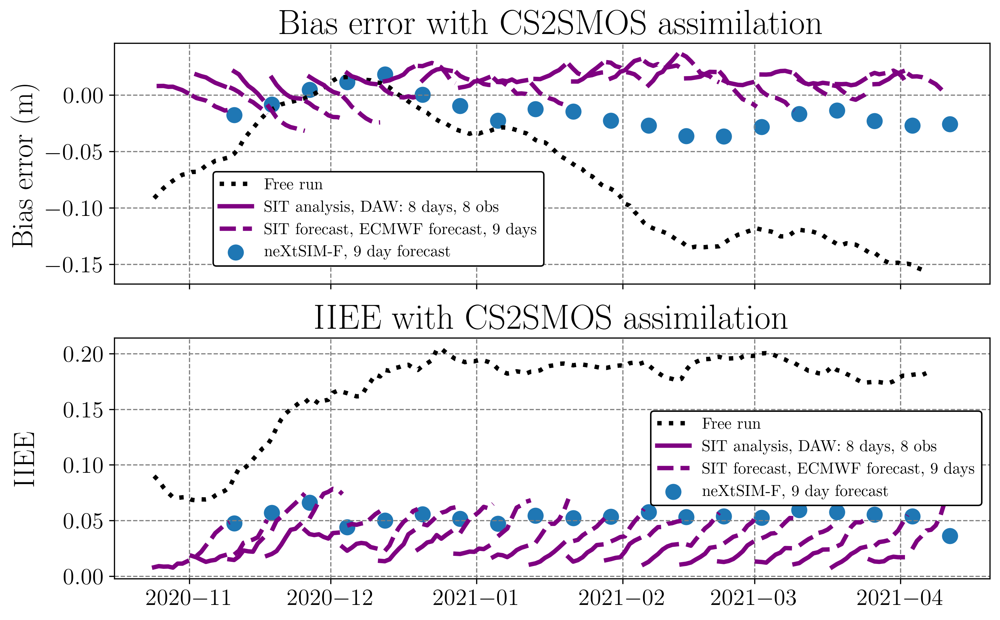

In [27]:
plt.rcParams['axes.facecolor'] = 'xkcd:white'

fig, (ax1, ax2) = plt.subplots(2, 1, figsize = (10, 6), sharex=True)
ax1.plot(time_cs2smos[:-6],bias_free_run[1:-2], label = "Free run", linestyle = 'dotted', color = 'k')
ax1.scatter(time_cs2smos[17::8],bias_nextsimF, label = 'neXtSIM-F, 9 day forecast')
i=0
ax1.plot(time_cs2smos[8*i+1:8*i + 8], bias_4dvar[0,1:8], color = colors_EOF[6], label = 'SIT analysis, DAW: 8 days, 8 obs')
ax1.plot(time_cs2smos[8*i+8:8*i + 17], bias_4dvar[0,8:], color = colors_EOF[6], linestyle = 'dashed', label = 'SIT forecast, ECMWF forecast, 9 days')

for i in range(1, 20):
 #   print(i)
    ax1.plot(time_cs2smos[8*i+1:8*i + 8], bias_4dvar[i,1:8], color = colors_EOF[6])
    ax1.plot(time_cs2smos[8*i+8:8*i + 17], bias_4dvar[i,8:], color = colors_EOF[6], linestyle = 'dashed')

ax2.plot(time_cs2smos[:-6],iiee_free_run[1:-2], label = "Free run", linestyle = 'dotted', color = 'k')
ax2.scatter(time_cs2smos[17::8],iiee_nextsimF, label = 'neXtSIM-F, 9 day forecast')
i=0
ax2.plot(time_cs2smos[8*i:8*i + 8], iiee_4dvar[0,:8], color = colors_EOF[6], label = 'SIT analysis, DAW: 8 days, 8 obs')
ax2.plot(time_cs2smos[8*i+8+1:8*i + 17], iiee_4dvar[0,8:-1], color = colors_EOF[6], linestyle = 'dashed', label = 'SIT forecast, ECMWF forecast, 9 days')

for i in range(1, 20):
 #   print(i)
    ax2.plot(time_cs2smos[8*i:8*i + 8], iiee_4dvar[i,:8], color = colors_EOF[6])
    ax2.plot(time_cs2smos[8*i+8+1:8*i + 17], iiee_4dvar[i,8:-1], color = colors_EOF[6], linestyle = 'dashed')
ax1.legend(fontsize=11, bbox_to_anchor=(0.5, 0.5))

ax2.legend(fontsize=11)
ax1.set_ylabel('Bias error (m)')
ax2.set_ylabel('IIEE')

ax1.set_title('Bias error with CS2SMOS assimilation')
ax2.set_title('IIEE with CS2SMOS assimilation')
fig.tight_layout(rect=[0, 0, 0.95, 1])  # Adjust the rect parameter if neededf
fig.align_ylabels()
plt.savefig('fig08.pdf', dpi = 300, bbox_inches='tight')


In [245]:
print((iiee_free_run[17::8]-iiee_4dvar[:-1,-1]).mean())
print(iiee_nextsimF.mean())
print(iiee_4dvar[:,-2].mean())

0.15785320589264842
0.052919625746815455
0.05884905873069553


(20, 18, 128, 128)
(177, 128, 128)


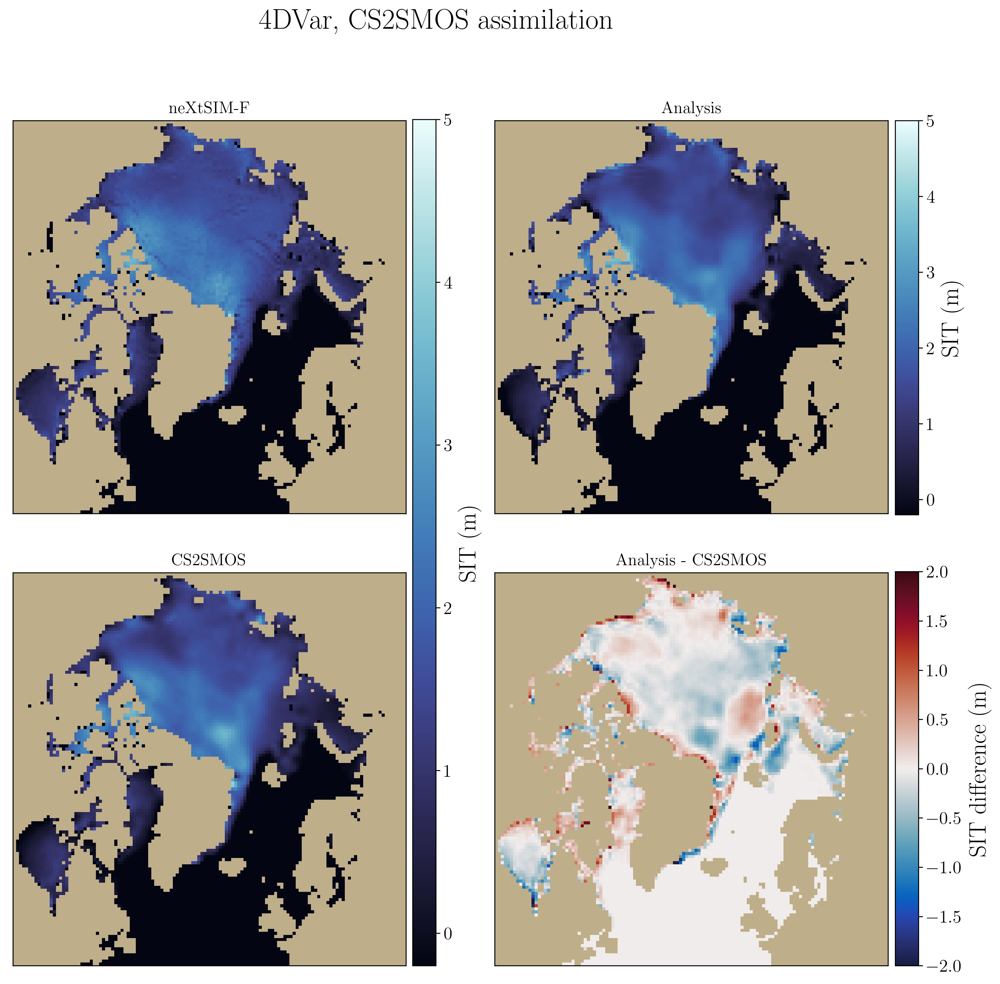

In [234]:
xana2 = np.load('11July/test/state_10.npy')
xbar = np.load('mean_norm.npy').reshape(8871,1)
EOF = np.load('EOFs_y8_norm.npy')[:,:8871]
state = xbar + EOF@np.reshape(xana2, (8871,1))
state2D = np.zeros((128*128))
state2D[unflatten] = state.reshape(8871)
state2D1 = state2D.reshape((128,128))

xback2 = np.load('11July/test/back_10.npy')
#xbar = np.load('EOF/mean.npy').reshape(8871,1)
#EOF = np.load('EOF/EOFs_y8.npy')[:,:7000]
#state = xbar + EOF@np.reshape(xback2, (7000,1))
state2D = np.zeros((128*128))
state2D[unflatten] = xback2.reshape(8871)
state2D2 = state2D.reshape((128,128))
x_4D = np.load('11July/test/x_analysis_forecast.npy')
print(np.shape(x_4D))
print(np.shape(im_truth))

ds = xr.open_dataset('Moorings_2009m01.nc')
ds_sit = ds['sit'].to_masked_array()
mask = ma.getmaskarray(ds_sit[0])
mask = 1-mask

mask = mask[91:, 8:-8]
mask = block_reduce(mask, block_size=(4, 4), func=np.min)


plt.rcParams['axes.facecolor'] = 'xkcd:putty'

fig = plt.figure(figsize = (13.5, 13))
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.15, hspace=0.15)
ax1 = plt.subplot2grid((2, 2), (0, 0))
ax2 = plt.subplot2grid((2, 2), (0, 1))
ax3 = plt.subplot2grid((2, 2), (1, 0))
ax4 = plt.subplot2grid((2, 2), (1, 1))                                    
ax1.set_title('neXtSIM-F', fontsize = 14)
im1 = ax1.imshow(ma.masked_array(sit_nextsim[17], mask = 1 - mask), origin = 'lower', cmap = cmocean.cm.ice, vmin = -0.2, vmax = 5)

ax1.grid(False)
ax1.set_xticks([])
ax1.set_yticks([])

ax2.set_title('Analysis', fontsize = 14)
im2 = ax2.imshow(ma.masked_array(x_4D[17,17], mask = 1 - mask), origin = 'lower', cmap = cmocean.cm.ice, vmin = -0.2, vmax = 5)
ax2.set_xticks([])
ax2.set_yticks([])

ax2.grid(False)

ax3.set_title('CS2SMOS', fontsize = 14)
im3 = ax3.imshow(ma.masked_array(im_truth[17*8+9].reshape((128,128)), mask = 1 - mask), origin = 'lower', cmap = cmocean.cm.ice, vmin = -0.2, vmax =5)
ax3.set_xticks([])
ax3.set_yticks([])

ax3.grid(False)

ax4.set_title('Analysis - CS2SMOS', fontsize = 14)
im4 = ax4.imshow(ma.masked_array( x_4D[17,17] - im_truth[17*8+9].reshape((128,128)), mask = 1 - mask), origin = 'lower', cmap = cmocean.cm.balance, vmin = -2, vmax = 2)
ax4.grid(False)

ax4.set_xticks([])
ax4.set_yticks([])

cbar_ax1 = fig.add_axes([0.48, 0.125, 0.02, 0.756])

cb1 = fig.colorbar(im1, ax=[ax1, ax3], cax = cbar_ax1, aspect=18.5, pad=0)
cb1.ax.tick_params(labelsize=15)

cbar_ax2 = fig.add_axes([0.895, 0.125, 0.02, 0.352])

cb2 = fig.colorbar(im4, ax=[ax4], cax = cbar_ax2, aspect=18.5, pad=0)
cb2.ax.tick_params(labelsize=15)

cbar_ax3 = fig.add_axes([0.895, 0.528, 0.02, 0.352])

cb3 = fig.colorbar(im2, ax=[ax2], cax = cbar_ax3, aspect=18.5, pad=0)
cb3.ax.tick_params(labelsize=15)
cb3.set_label("SIT (m)")
cb2.set_label("SIT difference (m)")
cb1.set_label("SIT (m)")                              
plt.suptitle('4DVar, CS2SMOS assimilation', fontsize = 24)
plt.savefig('fig09.pdf', dpi = 300, bbox_inches='tight')

# Surrogate

# Cost function

In [38]:
time_EOF_cycle = np.load('16Mai/test_EOF_time/time_cycle.npy')
time_EOF_forward = np.load('16Mai/test_EOF_time/time_forward.npy')
time_EOF_grad = np.load('16Mai/test_EOF_time/time_grad.npy')

time_diag_cycle = np.load('16Mai/test_diag_time/time_cycle.npy')
time_diag_forward = np.load('16Mai/test_diag_time/time_forward.npy')
time_diag_grad = np.load('16Mai/test_diag_time/time_grad.npy')

print('4D--Var-EOF')
print("Cycle average \n")
print(time_EOF_cycle.mean())
print('\n')
print("Forward average \n")
print(time_EOF_forward.mean()*8)
print(time_EOF_forward.std()*8)
print('\n')
print("Grad average \n")
print(time_EOF_grad.mean())
print(time_EOF_grad.std())
print('\n')
print('4D--Var-diag')
print("Cycle average \n")
print(time_diag_cycle.mean())

print('\n')
print("Forward average \n")

print(time_diag_forward.mean()*8)
print(time_diag_forward.std()*8)

print('\n')
print("Grad average \n")

print(time_diag_grad.mean())
print(time_diag_grad.std())

4D--Var-EOF
Cycle average 

161.85850585831537


Forward average 

0.5671137632782927
0.14479121463625047


Grad average 

1.7445448315477976
0.05451651798588108


4D--Var-diag
Cycle average 

229.26757748921713


Forward average 

0.5523779579546539
0.1327613666667549


Grad average 

1.3626823906796963
0.04479823645832316


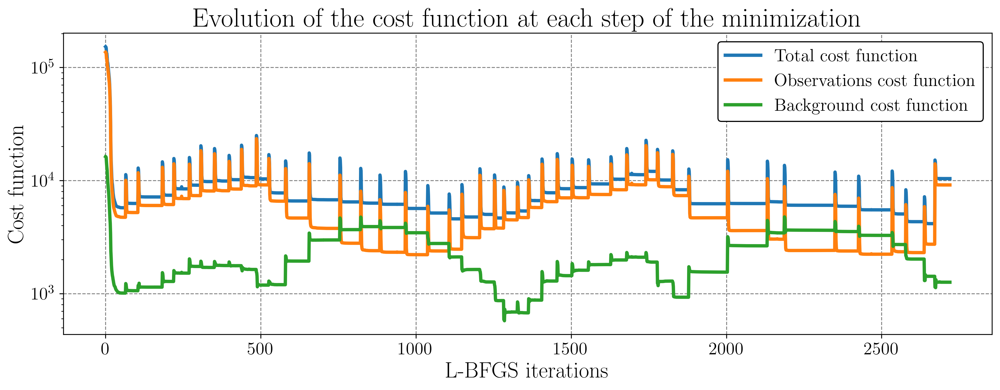

In [39]:
J_tot = np.load('14Avril/test_EOF_inf1_frac/J.npy')[:, 0, 0]
J_o = np.load('14Avril/test_EOF_inf1_frac/J_obs.npy')[:, 0, 0]
J_b = np.load('14Avril/test_EOF_inf1_frac/J_back.npy')[:, 0, 0]
plt.rcParams['axes.facecolor'] = 'xkcd:white'

plt.figure(figsize = (15, 5))
plt.semilogy(J_tot, label = 'Total cost function')
plt.semilogy(J_o/2, label = 'Observations cost function')
plt.semilogy(J_b/2, label = 'Background cost function')
plt.legend()
plt.xlabel('L-BFGS iterations')
plt.ylabel('Cost function')
plt.title('Evolution of the cost function at each step of the minimization')
plt.savefig('fig14.pdf', dpi = 300, bbox_inches='tight')

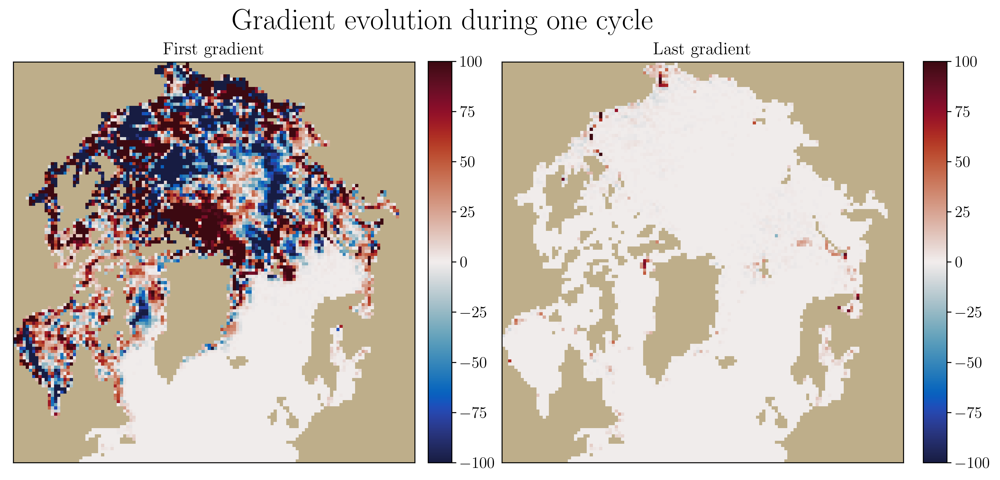

In [40]:
grad1 = np.load('test_grad/grad/grad_9862_cycle33.npy')
xbar = np.load('mean_norm.npy').reshape(8871,1)
EOF = np.load('EOFs_y8_norm.npy')[:,:8871]
#state = xbar + EOF@np.reshape(grad1, (8871,1))
grad1_2D = np.zeros((128*128))
grad1_2D[unflatten] = grad1.reshape(8871)
grad1_2D = grad1_2D.reshape((128,128))

grad2 = np.load('test_grad/grad/grad_9429_cycle31.npy')
grad2_2D = np.zeros((128*128))
grad2_2D[unflatten] = grad2.reshape(8871)
grad2_2D = grad2_2D.reshape((128,128))

plt.rcParams['axes.facecolor'] = 'xkcd:putty'

fig = plt.figure(figsize = (13.3, 6))
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.15, hspace=0.15)
ax1 = plt.subplot2grid((1, 2), (0, 0))
ax2 = plt.subplot2grid((1, 2), (0, 1))
                                
ax1.set_title('First gradient', fontsize = 14)
im1 = ax1.imshow(ma.masked_array(grad1_2D, mask = 1 - mask), origin = 'lower', cmap = cmocean.cm.balance, vmin = -100, vmax = 100)

ax1.grid(False)
ax1.set_xticks([])
ax1.set_yticks([])

ax2.set_title('Last gradient', fontsize = 14)
im2 = ax2.imshow(ma.masked_array(grad2_2D, mask = 1 - mask), origin = 'lower', cmap = cmocean.cm.balance, vmin = -100, vmax = 100)
ax2.set_xticks([])
ax2.set_yticks([])

ax2.grid(False)


cbar_ax1 = fig.add_axes([0.487, 0.125, 0.02, 0.756])

cb1 = fig.colorbar(im1, ax=[ax1], cax = cbar_ax1, aspect=18.5, pad=0)
cb1.ax.tick_params(labelsize=13)

cbar_ax2 = fig.add_axes([0.907, 0.125, 0.02, 0.756])

cb2 = fig.colorbar(im2, ax=[ax2], cax = cbar_ax2, aspect=18.5, pad=0)
cb2.ax.tick_params(labelsize=13)

                                    
plt.suptitle('Gradient evolution during one cycle', fontsize = 24)
plt.savefig('fig15.pdf', dpi = 300, bbox_inches='tight')

# Adaptive inflation

## Load results

In [41]:
N_x = 49
rmse_diag_adapt = np.zeros((N_x, 45, 32))
rmse_diag_adapt[0] = np.load("3Avril/test_inf06_diag_adapt/rmse.npy").reshape((1, 45, 32))

rmse_diag_adapt[1] = np.load("3Avril/test_inf065_diag_adapt/rmse.npy").reshape((1, 45, 32))

rmse_diag_adapt[2] = np.load("3Avril/test_inf07_diag_adapt/rmse.npy").reshape((1, 45, 32))
rmse_diag_adapt[3] = np.load("3Avril/test_inf075_diag_adapt/rmse.npy").reshape((1, 45, 32))
rmse_diag_adapt[4] = np.load("3Avril/test_inf08_diag_adapt/rmse.npy").reshape((1, 45, 32))
rmse_diag_adapt[5] = np.load("3Avril/test_inf085_diag_adapt/rmse.npy").reshape((1, 45, 32))

rmse_diag_adapt[6] = np.load("3Avril/test_inf09_diag_adapt/rmse.npy").reshape((1, 45, 32))
rmse_diag_adapt[7] = np.load("3Avril/test_inf095_diag_adapt/rmse.npy").reshape((1, 45, 32))

rmse_diag_adapt[8] = np.load("3Avril/test_inf1_diag_adapt/rmse.npy").reshape((1, 45, 32))
rmse_diag_adapt[9] = np.load("3Avril/test_inf105_diag_adapt/rmse.npy").reshape((1, 45, 32))

rmse_diag_adapt[10] = np.load("3Avril/test_inf11_diag_adapt/rmse.npy").reshape((1, 45, 32))
rmse_diag_adapt[11] = np.load("3Avril/test_inf115_diag_adapt/rmse.npy").reshape((1, 45, 32))

rmse_diag_adapt[12] = np.load("3Avril/test_inf12_diag_adapt/rmse.npy").reshape((1, 45, 32))
rmse_diag_adapt[13] = np.load("3Avril/test_inf125_diag_adapt/rmse.npy").reshape((1, 45, 32))
rmse_diag_adapt[14] = np.load("3Avril/test_inf13_diag_adapt/rmse.npy").reshape((1, 45, 32))
rmse_diag_adapt[15] = np.load("3Avril/test_inf135_diag_adapt/rmse.npy").reshape((1, 45, 32))

rmse_diag_adapt[16] = np.load("3Avril/test_inf14_diag_adapt/rmse.npy").reshape((1, 45, 32))
rmse_diag_adapt[17] = np.load("3Avril/test_inf145_diag_adapt/rmse.npy").reshape((1, 45, 32))

rmse_diag_adapt[18] = np.load("3Avril/test_inf15_diag_adapt/rmse.npy").reshape((1, 45, 32))
rmse_diag_adapt[19] = np.load("3Avril/test_inf155_diag_adapt/rmse.npy").reshape((1, 45, 32))
rmse_diag_adapt[20] = np.load("3Avril/test_inf16_diag_adapt/rmse.npy").reshape((1, 45, 32))
rmse_diag_adapt[21] = np.load("3Avril/test_inf165_diag_adapt/rmse.npy").reshape((1, 45, 32))

rmse_diag_adapt[22] = np.load("3Avril/test_inf17_diag_adapt/rmse.npy").reshape((1, 45, 32))
rmse_diag_adapt[23] = np.load("3Avril/test_inf175_diag_adapt/rmse.npy").reshape((1, 45, 32))

rmse_diag_adapt[24] = np.load("3Avril/test_inf18_diag_adapt/rmse.npy").reshape((1, 45, 32))
rmse_diag_adapt[25] = np.load("3Avril/test_inf185_diag_adapt/rmse.npy").reshape((1, 45, 32))

rmse_diag_adapt[26] = np.load("3Avril/test_inf19_diag_adapt/rmse.npy").reshape((1, 45, 32))
rmse_diag_adapt[27] = np.load("3Avril/test_inf195_diag_adapt/rmse.npy").reshape((1, 45, 32))

rmse_diag_adapt[28] = np.load("3Avril/test_inf2_diag_adapt/rmse.npy").reshape((1, 45, 32))
rmse_diag_adapt[29] = np.load("3Avril/test_inf205_diag_adapt/rmse.npy").reshape((1, 45, 32))
rmse_diag_adapt[30] = np.load("3Avril/test_inf21_diag_adapt/rmse.npy").reshape((1, 45, 32))
rmse_diag_adapt[31] = np.load("3Avril/test_inf215_diag_adapt/rmse.npy").reshape((1, 45, 32))
rmse_diag_adapt[32] = np.load("3Avril/test_inf22_diag_adapt/rmse.npy").reshape((1, 45, 32))
rmse_diag_adapt[33] = np.load("3Avril/test_inf225_diag_adapt/rmse.npy").reshape((1, 45, 32))
rmse_diag_adapt[34] = np.load("3Avril/test_inf23_diag_adapt/rmse.npy").reshape((1, 45, 32))
rmse_diag_adapt[35] = np.load("3Avril/test_inf235_diag_adapt/rmse.npy").reshape((1, 45, 32))
rmse_diag_adapt[36] = np.load("3Avril/test_inf24_diag_adapt/rmse.npy").reshape((1, 45, 32))
rmse_diag_adapt[37] = np.load("3Avril/test_inf245_diag_adapt/rmse.npy").reshape((1, 45, 32))
rmse_diag_adapt[38] = np.load("3Avril/test_inf25_diag_adapt/rmse.npy").reshape((1, 45, 32))
rmse_diag_adapt[39] = np.load("3Avril/test_inf255_diag_adapt/rmse.npy").reshape((1, 45, 32))
rmse_diag_adapt[40] = np.load("3Avril/test_inf26_diag_adapt/rmse.npy").reshape((1, 45, 32))
rmse_diag_adapt[41] = np.load("3Avril/test_inf265_diag_adapt/rmse.npy").reshape((1, 45, 32))
rmse_diag_adapt[42] = np.load("3Avril/test_inf27_diag_adapt/rmse.npy").reshape((1, 45, 32))
rmse_diag_adapt[43] = np.load("3Avril/test_inf275_diag_adapt/rmse.npy").reshape((1, 45, 32))
rmse_diag_adapt[44] = np.load("3Avril/test_inf28_diag_adapt/rmse.npy").reshape((1, 45, 32))
rmse_diag_adapt[45] = np.load("3Avril/test_inf285_diag_adapt/rmse.npy").reshape((1, 45, 32))
rmse_diag_adapt[46] = np.load("3Avril/test_inf29_diag_adapt/rmse.npy").reshape((1, 45, 32))
rmse_diag_adapt[47] = np.load("3Avril/test_inf295_diag_adapt/rmse.npy").reshape((1, 45, 32))
rmse_diag_adapt[48] = np.load("3Avril/test_inf3_diag_adapt/rmse.npy").reshape((1, 45, 32))

N_x = 49
rmse_diag_constant = np.zeros((N_x, 45, 32))
rmse_diag_constant[0] = np.load("26Avril/test_inf06_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[1] = np.load("26Avril/test_inf065_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[2] = np.load("26Avril/test_inf07_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[3] = np.load("26Avril/test_inf075_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[4] = np.load("26Avril/test_inf08_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[5] = np.load("26Avril/test_inf085_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[6] = np.load("26Avril/test_inf09_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[7] = np.load("26Avril/test_inf095_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[8] = np.load("26Avril/test_inf1_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[9] = np.load("26Avril/test_inf105_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[10] = np.load("26Avril/test_inf11_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[11] = np.load("26Avril/test_inf115_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[12] = np.load("26Avril/test_inf12_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[13] = np.load("26Avril/test_inf125_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[14] = np.load("26Avril/test_inf13_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[15] = np.load("26Avril/test_inf135_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[16] = np.load("26Avril/test_inf14_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[17] = np.load("26Avril/test_inf145_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[18] = np.load("26Avril/test_inf15_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[19] = np.load("26Avril/test_inf155_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[20] = np.load("26Avril/test_inf16_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[21] = np.load("26Avril/test_inf165_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[22] = np.load("26Avril/test_inf17_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[23] = np.load("26Avril/test_inf175_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[24] = np.load("26Avril/test_inf18_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[25] = np.load("26Avril/test_inf185_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[26] = np.load("26Avril/test_inf19_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[27] = np.load("26Avril/test_inf195_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[28] = np.load("26Avril/test_inf2_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[29] = np.load("26Avril/test_inf205_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[30] = np.load("26Avril/test_inf21_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[31] = np.load("26Avril/test_inf215_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[32] = np.load("26Avril/test_inf22_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[33] = np.load("26Avril/test_inf225_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[34] = np.load("26Avril/test_inf23_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[35] = np.load("26Avril/test_inf235_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[36] = np.load("26Avril/test_inf24_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[37] = np.load("26Avril/test_inf245_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[38] = np.load("26Avril/test_inf25_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[39] = np.load("26Avril/test_inf255_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[40] = np.load("26Avril/test_inf26_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[41] = np.load("26Avril/test_inf265_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[42] = np.load("26Avril/test_inf27_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[43] = np.load("26Avril/test_inf275_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[44] = np.load("26Avril/test_inf28_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[45] = np.load("26Avril/test_inf285_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[46] = np.load("26Avril/test_inf29_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[47] = np.load("26Avril/test_inf295_diag/rmse.npy").reshape((1, 45, 32))
rmse_diag_constant[48] = np.load("26Avril/test_inf3_diag/rmse.npy").reshape((1, 45, 32))


lambda_EOF_adapt = np.array([0.6, 0.65,
                             0.7, 0.75, 
                             0.8, 0.85,
                             0.9, 0.95,
                             1.0, 1.05, 
                             1.1, 1.15, 1.2, 1.25, 1.3, 1.35, 1.4, 1.45, 1.5, 1.55, 1.6, 1.65, 1.7, 1.75, 1.8, 1.85, 1.9, 1.95, 2,
                             2.05, 2.1, 2.15, 2.2, 2.25, 2.3, 2.35, 2.4, 2.45, 2.5, 2.55, 2.6, 2.65, 2.7, 
                             2.75, 2.8, 2.85, 2.9, 2.95, 3
                            ])


N_x = 49
rmse_EOF_constant = np.zeros((N_x, 45, 32))
rmse_EOF_constant[0] = np.load("23Avril/test_inf06_EOF/rmse.npy").reshape((1, 45, 32))

rmse_EOF_constant[1] = np.load("23Avril/test_inf065_EOF/rmse.npy").reshape((1, 45, 32))

rmse_EOF_constant[2] = np.load("23Avril/test_inf07_EOF/rmse.npy").reshape((1, 45, 32))
rmse_EOF_constant[3] = np.load("23Avril/test_inf075_EOF/rmse.npy").reshape((1, 45, 32))
rmse_EOF_constant[4] = np.load("23Avril/test_inf08_EOF/rmse.npy").reshape((1, 45, 32))
rmse_EOF_constant[5] = np.load("23Avril/test_inf085_EOF/rmse.npy").reshape((1, 45, 32))

rmse_EOF_constant[6] = np.load("23Avril/test_inf09_EOF/rmse.npy").reshape((1, 45, 32))
rmse_EOF_constant[7] = np.load("23Avril/test_inf095_EOF/rmse.npy").reshape((1, 45, 32))

rmse_EOF_constant[8] = np.load("23Avril/test_inf1_EOF/rmse.npy").reshape((1, 45, 32))
rmse_EOF_constant[9] = np.load("23Avril/test_inf105_EOF/rmse.npy").reshape((1, 45, 32))

rmse_EOF_constant[10] = np.load("23Avril/test_inf11_EOF/rmse.npy").reshape((1, 45, 32))
rmse_EOF_constant[11] = np.load("23Avril/test_inf115_EOF/rmse.npy").reshape((1, 45, 32))

rmse_EOF_constant[12] = np.load("23Avril/test_inf12_EOF/rmse.npy").reshape((1, 45, 32))
rmse_EOF_constant[13] = np.load("23Avril/test_inf125_EOF/rmse.npy").reshape((1, 45, 32))

rmse_EOF_constant[14] = np.load("23Avril/test_inf13_EOF/rmse.npy").reshape((1, 45, 32))
rmse_EOF_constant[15] = np.load("23Avril/test_inf135_EOF/rmse.npy").reshape((1, 45, 32))

rmse_EOF_constant[16] = np.load("23Avril/test_inf14_EOF/rmse.npy").reshape((1, 45, 32))
rmse_EOF_constant[17] = np.load("23Avril/test_inf145_EOF/rmse.npy").reshape((1, 45, 32))

rmse_EOF_constant[18] = np.load("23Avril/test_inf15_EOF/rmse.npy").reshape((1, 45, 32))
rmse_EOF_constant[19] = np.load("23Avril/test_inf155_EOF/rmse.npy").reshape((1, 45, 32))
rmse_EOF_constant[20] = np.load("23Avril/test_inf16_EOF/rmse.npy").reshape((1, 45, 32))
rmse_EOF_constant[21] = np.load("23Avril/test_inf165_EOF/rmse.npy").reshape((1, 45, 32))

rmse_EOF_constant[22] = np.load("23Avril/test_inf17_EOF/rmse.npy").reshape((1, 45, 32))
rmse_EOF_constant[23] = np.load("23Avril/test_inf175_EOF/rmse.npy").reshape((1, 45, 32))

rmse_EOF_constant[24] = np.load("23Avril/test_inf18_EOF/rmse.npy").reshape((1, 45, 32))
rmse_EOF_constant[25] = np.load("23Avril/test_inf185_EOF/rmse.npy").reshape((1, 45, 32))

rmse_EOF_constant[26] = np.load("23Avril/test_inf19_EOF/rmse.npy").reshape((1, 45, 32))
rmse_EOF_constant[27] = np.load("23Avril/test_inf195_EOF/rmse.npy").reshape((1, 45, 32))

rmse_EOF_constant[28] = np.load("23Avril/test_inf2_EOF/rmse.npy").reshape((1, 45, 32))
rmse_EOF_constant[29] = np.load("23Avril/test_inf205_EOF/rmse.npy").reshape((1, 45, 32))
rmse_EOF_constant[30] = np.load("23Avril/test_inf21_EOF/rmse.npy").reshape((1, 45, 32))
rmse_EOF_constant[31] = np.load("23Avril/test_inf215_EOF/rmse.npy").reshape((1, 45, 32))
rmse_EOF_constant[32] = np.load("23Avril/test_inf22_EOF/rmse.npy").reshape((1, 45, 32))
rmse_EOF_constant[33] = np.load("23Avril/test_inf225_EOF/rmse.npy").reshape((1, 45, 32))
rmse_EOF_constant[34] = np.load("23Avril/test_inf23_EOF/rmse.npy").reshape((1, 45, 32))
rmse_EOF_constant[35] = np.load("23Avril/test_inf235_EOF/rmse.npy").reshape((1, 45, 32))
rmse_EOF_constant[36] = np.load("23Avril/test_inf24_EOF/rmse.npy").reshape((1, 45, 32))
rmse_EOF_constant[37] = np.load("23Avril/test_inf245_EOF/rmse.npy").reshape((1, 45, 32))
rmse_EOF_constant[38] = np.load("23Avril/test_inf25_EOF/rmse.npy").reshape((1, 45, 32))
rmse_EOF_constant[39] = np.load("23Avril/test_inf255_EOF/rmse.npy").reshape((1, 45, 32))
rmse_EOF_constant[40] = np.load("23Avril/test_inf26_EOF/rmse.npy").reshape((1, 45, 32))
rmse_EOF_constant[41] = np.load("23Avril/test_inf265_EOF/rmse.npy").reshape((1, 45, 32))
rmse_EOF_constant[42] = np.load("23Avril/test_inf27_EOF/rmse.npy").reshape((1, 45, 32))
rmse_EOF_constant[43] = np.load("23Avril/test_inf275_EOF/rmse.npy").reshape((1, 45, 32))
rmse_EOF_constant[44] = np.load("23Avril/test_inf28_EOF/rmse.npy").reshape((1, 45, 32))
rmse_EOF_constant[45] = np.load("23Avril/test_inf285_EOF/rmse.npy").reshape((1, 45, 32))
rmse_EOF_constant[46] = np.load("23Avril/test_inf29_EOF/rmse.npy").reshape((1, 45, 32))
rmse_EOF_constant[47] = np.load("23Avril/test_inf295_EOF/rmse.npy").reshape((1, 45, 32))
rmse_EOF_constant[48] = np.load("23Avril/test_inf3_EOF/rmse.npy").reshape((1, 45, 32))

#res_rmse_EOF_adapt = np.zeros((53, 1440))
#for i in range(53):
 #   res_rmse_EOF_adapt[i] = rmse(rmse_EOF_adapt[i]*mask.squeeze(), truth*mask.squeeze())
#res_rmse_EOF_adapt = res_rmse_EOF_adapt.reshape((53, 45, 32))

N_x = 49
rmse_EOF_adapt = np.zeros((N_x, 45, 32))
rmse_EOF_adapt[0] = np.load("2Avril/test_inf06_EOF_adapt/rmse.npy").reshape((1, 45, 32))

rmse_EOF_adapt[1] = np.load("2Avril/test_inf065_EOF_adapt/rmse.npy").reshape((1, 45, 32))

rmse_EOF_adapt[2] = np.load("2Avril/test_inf07_EOF_adapt/rmse.npy").reshape((1, 45, 32))
rmse_EOF_adapt[3] = np.load("2Avril/test_inf075_EOF_adapt/rmse.npy").reshape((1, 45, 32))
rmse_EOF_adapt[4] = np.load("2Avril/test_inf08_EOF_adapt/rmse.npy").reshape((1, 45, 32))
rmse_EOF_adapt[5] = np.load("2Avril/test_inf085_EOF_adapt/rmse.npy").reshape((1, 45, 32))

rmse_EOF_adapt[6] = np.load("2Avril/test_inf09_EOF_adapt/rmse.npy").reshape((1, 45, 32))
rmse_EOF_adapt[7] = np.load("2Avril/test_inf095_EOF_adapt/rmse.npy").reshape((1, 45, 32))

rmse_EOF_adapt[8] = np.load("2Avril/test_inf1_EOF_adapt/rmse.npy").reshape((1, 45, 32))
rmse_EOF_adapt[9] = np.load("2Avril/test_inf105_EOF_adapt/rmse.npy").reshape((1, 45, 32))

rmse_EOF_adapt[10] = np.load("2Avril/test_inf11_EOF_adapt/rmse.npy").reshape((1, 45, 32))
rmse_EOF_adapt[11] = np.load("2Avril/test_inf115_EOF_adapt/rmse.npy").reshape((1, 45, 32))

rmse_EOF_adapt[12] = np.load("2Avril/test_inf12_EOF_adapt/rmse.npy").reshape((1, 45, 32))
rmse_EOF_adapt[13] = np.load("2Avril/test_inf125_EOF_adapt/rmse.npy").reshape((1, 45, 32))

rmse_EOF_adapt[14] = np.load("2Avril/test_inf13_EOF_adapt/rmse.npy").reshape((1, 45, 32))
rmse_EOF_adapt[15] = np.load("2Avril/test_inf135_EOF_adapt/rmse.npy").reshape((1, 45, 32))

rmse_EOF_adapt[16] = np.load("2Avril/test_inf14_EOF_adapt/rmse.npy").reshape((1, 45, 32))
rmse_EOF_adapt[17] = np.load("2Avril/test_inf145_EOF_adapt/rmse.npy").reshape((1, 45, 32))

rmse_EOF_adapt[18] = np.load("2Avril/test_inf15_EOF_adapt/rmse.npy").reshape((1, 45, 32))
rmse_EOF_adapt[19] = np.load("2Avril/test_inf155_EOF_adapt/rmse.npy").reshape((1, 45, 32))
rmse_EOF_adapt[20] = np.load("2Avril/test_inf16_EOF_adapt/rmse.npy").reshape((1, 45, 32))
rmse_EOF_adapt[21] = np.load("2Avril/test_inf165_EOF_adapt/rmse.npy").reshape((1, 45, 32))

rmse_EOF_adapt[22] = np.load("2Avril/test_inf17_EOF_adapt/rmse.npy").reshape((1, 45, 32))
rmse_EOF_adapt[23] = np.load("2Avril/test_inf175_EOF_adapt/rmse.npy").reshape((1, 45, 32))

rmse_EOF_adapt[24] = np.load("2Avril/test_inf18_EOF_adapt/rmse.npy").reshape((1, 45, 32))
rmse_EOF_adapt[25] = np.load("2Avril/test_inf185_EOF_adapt/rmse.npy").reshape((1, 45, 32))

rmse_EOF_adapt[26] = np.load("2Avril/test_inf19_EOF_adapt/rmse.npy").reshape((1, 45, 32))
rmse_EOF_adapt[27] = np.load("2Avril/test_inf195_EOF_adapt/rmse.npy").reshape((1, 45, 32))

rmse_EOF_adapt[28] = np.load("2Avril/test_inf2_EOF_adapt/rmse.npy").reshape((1, 45, 32))
rmse_EOF_adapt[29] = np.load("2Avril/test_inf205_EOF_adapt/rmse.npy").reshape((1, 45, 32))
rmse_EOF_adapt[30] = np.load("2Avril/test_inf21_EOF_adapt/rmse.npy").reshape((1, 45, 32))
rmse_EOF_adapt[31] = np.load("2Avril/test_inf215_EOF_adapt/rmse.npy").reshape((1, 45, 32))
rmse_EOF_adapt[32] = np.load("2Avril/test_inf22_EOF_adapt/rmse.npy").reshape((1, 45, 32))
rmse_EOF_adapt[33] = np.load("2Avril/test_inf225_EOF_adapt/rmse.npy").reshape((1, 45, 32))
rmse_EOF_adapt[34] = np.load("2Avril/test_inf23_EOF_adapt/rmse.npy").reshape((1, 45, 32))
rmse_EOF_adapt[35] = np.load("2Avril/test_inf235_EOF_adapt/rmse.npy").reshape((1, 45, 32))
rmse_EOF_adapt[36] = np.load("2Avril/test_inf24_EOF_adapt/rmse.npy").reshape((1, 45, 32))
rmse_EOF_adapt[37] = np.load("2Avril/test_inf245_EOF_adapt/rmse.npy").reshape((1, 45, 32))
rmse_EOF_adapt[38] = np.load("2Avril/test_inf25_EOF_adapt/rmse.npy").reshape((1, 45, 32))
rmse_EOF_adapt[39] = np.load("2Avril/test_inf255_EOF_adapt/rmse.npy").reshape((1, 45, 32))
rmse_EOF_adapt[40] = np.load("2Avril/test_inf26_EOF_adapt/rmse.npy").reshape((1, 45, 32))
rmse_EOF_adapt[41] = np.load("2Avril/test_inf265_EOF_adapt/rmse.npy").reshape((1, 45, 32))
rmse_EOF_adapt[42] = np.load("2Avril/test_inf27_EOF_adapt/rmse.npy").reshape((1, 45, 32))
rmse_EOF_adapt[43] = np.load("2Avril/test_inf275_EOF_adapt/rmse.npy").reshape((1, 45, 32))
rmse_EOF_adapt[44] = np.load("2Avril/test_inf28_EOF_adapt/rmse.npy").reshape((1, 45, 32))
rmse_EOF_adapt[45] = np.load("2Avril/test_inf285_EOF_adapt/rmse.npy").reshape((1, 45, 32))
rmse_EOF_adapt[46] = np.load("2Avril/test_inf29_EOF_adapt/rmse.npy").reshape((1, 45, 32))
rmse_EOF_adapt[47] = np.load("2Avril/test_inf295_EOF_adapt/rmse.npy").reshape((1, 45, 32))
rmse_EOF_adapt[48] = np.load("2Avril/test_inf3_EOF_adapt/rmse.npy").reshape((1, 45, 32))



## Plot results

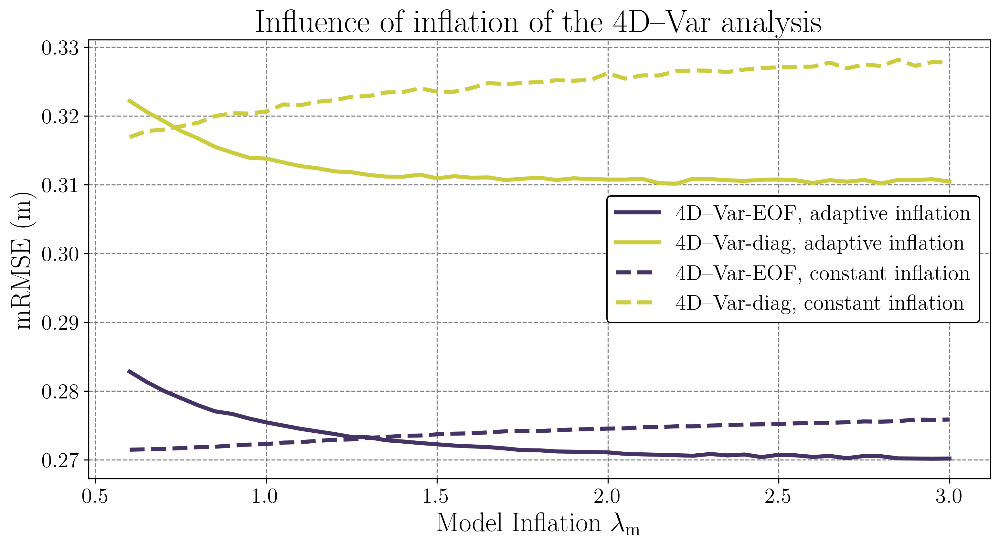

In [42]:
cmap_diag = plt.get_cmap('gist_stern')
colors_diag = cmap_diag(np.linspace(0,1,11))

plt.rcParams['axes.facecolor'] = 'xkcd:white'
plt.figure(figsize = (12, 6))
plt.plot(lambda_EOF_adapt, C*rmse_EOF_adapt[:,23:].mean(axis = (1, 2)), label = '4D--Var-EOF, adaptive inflation', color = colors_diag[2])
plt.plot(lambda_EOF_adapt, C*rmse_diag_adapt[:,23:].mean(axis = (1, 2)), label = '4D--Var-diag, adaptive inflation',  color = colors_diag[8])
plt.plot(lambda_EOF_adapt, C*rmse_EOF_constant[:,23:].mean(axis = (1, 2)), label = '4D--Var-EOF, constant inflation',linestyle = 'dashed', color = colors_diag[2])
plt.plot(lambda_EOF_adapt, C*rmse_diag_constant[:,23:].mean(axis = (1, 2)), label = '4D--Var-diag, constant inflation', linestyle = 'dashed', color = colors_diag[8])

plt.legend()
plt.xlabel('Model Inflation $\lambda_{\mathrm{m}}$')
plt.ylabel('mRMSE (m)')
plt.title('Influence of inflation of the 4D--Var analysis')
plt.savefig('fig18.pdf', dpi = 300, bbox_inches='tight')

1.0046931954290994
0.9666413672999851


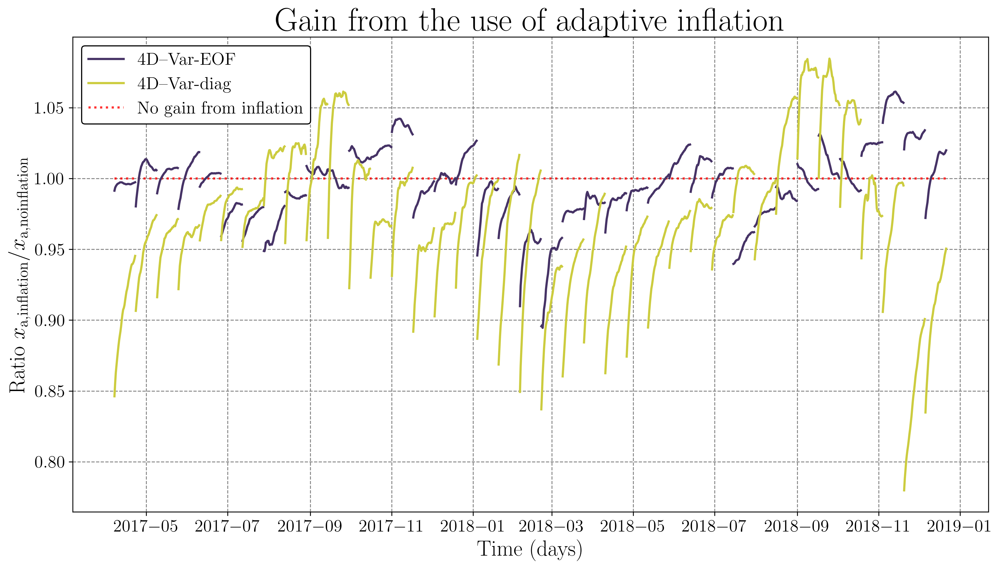

In [43]:

truth= np.load('14Avril/test_EOF_inf1_frac/x_truth.npy')
obs_gauss = np.load('14Avril/test_EOF_inf1_gauss/obs.npy')
obs_frac = np.load('14Avril/test_EOF_inf1_frac/obs.npy')
obs_clip = np.load('14Avril/test_EOF_inf1_frac_clip/obs.npy')

rmse_gauss = C*rmse(obs_gauss[:8*45], truth[::4])
rmse_frac = C*rmse(obs_frac[:8*45], truth[::4])
rmse_clip = C*rmse(obs_clip[:8*45], truth[::4])
#rmse_frac = rmse(obs_4Dvar_fracnoise[:8*16], truth[::4])
sit_input = np.load('17Avril/diagB_frac_inf1/sit_input.npy')*mask.squeeze()
def rmse2(x, y):
    return np.sqrt(np.mean((x - y)**2))
N = np.arange(36*5+1)/2
N2 = np.arange(20*56 + 1)/2
plt.rcParams['axes.facecolor'] = 'xkcd:white'
cmap_EOF = plt.get_cmap('brg_r')
colors_EOF = cmap_EOF(np.linspace(0,1,9))
rmse_diag_adapt = np.load("3Avril/test_inf3_diag_adapt/rmse.npy")
rmse_EOF_adapt = np.load("2Avril/test_inf295_EOF_adapt/rmse.npy")
rmse_EOF_const = np.load("23Avril/test_inf1_EOF/rmse.npy")
rmse_diag_const = np.load("26Avril/test_inf1_diag/rmse.npy")

cmap_diag = plt.get_cmap('gist_stern')
colors_diag = cmap_diag(np.linspace(0,1,11))
fig, ax1 = plt.subplots(1, 1, figsize = (15,8), sharex = True, sharey = True)
ax1.hlines(1, time[6*32],time[32*45], color = 'red', label = 'No gain from inflation', alpha = 0.8, linewidth = 2, linestyle = 'dotted')

i = 6
#ax1.plot(time[32*i:32*i+32], EOF_gauss_rmse[32*i:32*i+32], color = colors_EOF[4], label = '4D--Var-EOF, obs : $\mathbf{\\tilde{x}}_\mathrm{obs}^{\mathrm{G}}$', linewidth = 2)
ax1.plot(time[32*i:32*i+32], rmse_EOF_adapt[32*i:32*i+32]/rmse_EOF_const[32*i:32*i+32], label = '4D--Var-EOF', linewidth = 2,color = colors_diag[2])
ax1.plot(time[32*i:32*i+32], rmse_diag_adapt[32*i:32*i+32]/rmse_diag_const[32*i:32*i+32], color = colors_diag[8],label = '4D--Var-diag', linewidth = 2)

for i in range(7, 45):
    #ax1.plot(time[32*i:32*i+32], C*EOF_gauss_rmse[32*i:32*i+32], color = colors_EOF[4], linewidth = 2)
    ax1.plot(time[32*i:32*i+32], rmse_EOF_adapt[32*i:32*i+32]/rmse_EOF_const[32*i:32*i+32], color =colors_diag[2], linewidth = 2)
    ax1.plot(time[32*i:32*i+32], rmse_diag_adapt[32*i:32*i+32]/rmse_diag_const[32*i:32*i+32], color = colors_diag[8], linewidth = 2)

#ax1.scatter(time[0], rmse2(sit_input, truth[0]*mask.squeeze()), label = 'Initial first guess', color = 'k')

    
ax1.legend()

#plt.ylim([0, 2])
ax1.set_xlabel('Time (days)')
ax1.set_ylabel('Ratio $x_{\mathrm{a, inflation}}/x_{\mathrm{a, no inflation}}$')
ax1.set_title('Gain from the use of adaptive inflation', fontsize = 30)

plt.savefig('fig19.pdf', dpi = 300, bbox_inches='tight')
print(np.mean(rmse_EOF_adapt/EOF_gauss_rmse))
print(np.mean(rmse_diag_adapt/diagB_gauss_rmse))

# Frequency of observation

mRMSE EOF with 2 obs: 0.373
mRMSE EOF with 4 obs: 0.309
mRMSE EOF with 8 obs: 0.273
mRMSE EOF with 16 obs: 0.25


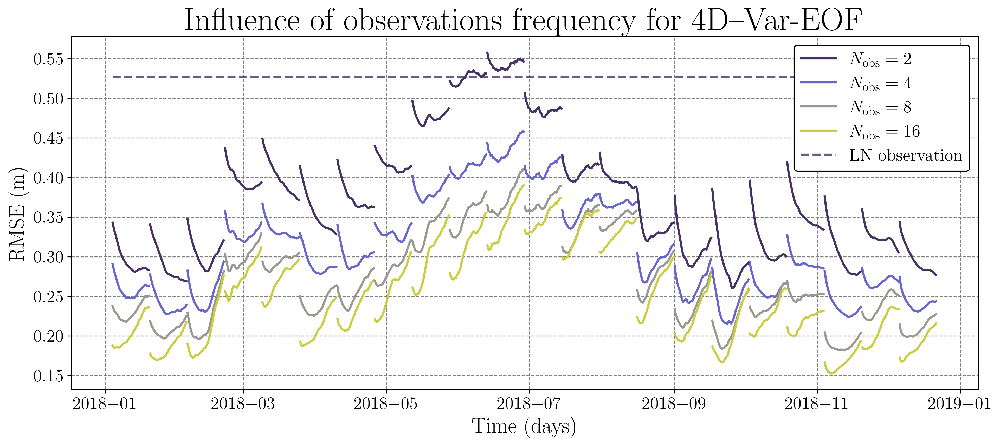

In [44]:
EOF_2obs = np.load('23Avril/EOF_2obs/rmse.npy')
EOF_4obs = np.load('23Avril/EOF_4obs/rmse.npy')
EOF_8obs = np.load('23Avril/EOF_8obs/rmse.npy')
EOF_16obs = np.load('23Avril/EOF_16obs/rmse.npy')

truth= np.load('14Avril/test_EOF_inf1_frac/x_truth.npy')
obs_gauss = np.load('14Avril/test_EOF_inf1_gauss/obs.npy')
obs_frac = np.load('14Avril/test_EOF_inf1_frac/obs.npy')
obs_clip = np.load('14Avril/test_EOF_inf1_frac_clip/obs.npy')

rmse_gauss = C*rmse(obs_gauss[:8*45], truth[::4])
rmse_frac = C*rmse(obs_frac[:8*45], truth[::4])
rmse_clip = C*rmse(obs_clip[:8*45], truth[::4])
#rmse_frac = rmse(obs_4Dvar_fracnoise[:8*16], truth[::4])
sit_input = np.load('17Avril/diagB_frac_inf1/sit_input.npy')*mask.squeeze()
def rmse2(x, y):
    return np.sqrt(np.mean((x - y)**2))
N = np.arange(36*5+1)/2
N2 = np.arange(20*56 + 1)/2
#plt.rcParams['axes.facecolor'] = 'xkcd:white'
cmap_EOF = plt.get_cmap('brg_r')
colors_EOF = cmap_EOF(np.linspace(0,1,9))
plt.rcParams['axes.facecolor'] = 'xkcd:white'

cmap_diag = plt.get_cmap('gist_stern')
colors_diag = cmap_diag(np.linspace(0,1,11))
fig, ax2 = plt.subplots(1, 1, figsize = (15,6), sharex = True, sharey = True)


#plt.ylim([0, 2])

ax2.hlines(rmse_frac.mean(), time[23*32],time[32*45], color = colors_diag[2], label = 'LN observation', alpha = 0.8, linewidth = 2, linestyle = 'dashed')

i =23
ax2.plot(time[32*i:32*i+32], C*EOF_2obs[32*i:32*i+32], color = colors_diag[2], label = '$N_{\mathrm{obs}} = 2$', linewidth = 2)
ax2.plot(time[32*i:32*i+32], C*EOF_4obs[32*i:32*i+32], color = colors_diag[4], label = '$N_{\mathrm{obs}} = 4$', linewidth = 2)
ax2.plot(time[32*i:32*i+32], C*EOF_8obs[32*i:32*i+32], color = colors_diag[6], label = '$N_{\mathrm{obs}} = 8$', linewidth = 2)
ax2.plot(time[32*i:32*i+32], C*EOF_16obs[32*i:32*i+32], color = colors_diag[8], label = '$N_{\mathrm{obs}} = 16$', linewidth = 2)

for i in range(24, 45):
    ax2.plot(time[32*i:32*i+32], C*EOF_2obs[32*i:32*i+32], color = colors_diag[2], linewidth = 2)
    ax2.plot(time[32*i:32*i+32], C*EOF_4obs[32*i:32*i+32], color = colors_diag[4], linewidth = 2)
    ax2.plot(time[32*i:32*i+32], C*EOF_8obs[32*i:32*i+32], color = colors_diag[6], linewidth = 2)
    ax2.plot(time[32*i:32*i+32], C*EOF_16obs[32*i:32*i+32], color = colors_diag[8], linewidth = 2)
#ax2.scatter(time[23*32], rmse2(sit_input, truth[0]*mask.squeeze()), label = 'Initial first guess', color = 'k')

    
ax2.legend()

#plt.ylim([0, 2])
ax2.set_xlabel('Time (days)')
ax2.set_ylabel('RMSE (m)')
ax2.set_title('Influence of observations frequency for 4D--Var-EOF', fontsize = 30)
plt.savefig('fig16.pdf', dpi = 300, bbox_inches='tight')


print('mRMSE EOF with 2 obs: {}'.format(np.mean(C*EOF_2obs[23*32:]).round(3)))
print('mRMSE EOF with 4 obs: {}'.format(np.mean(C*EOF_4obs[23*32:]).round(3)))
print('mRMSE EOF with 8 obs: {}'.format(np.mean(C*EOF_8obs[23*32:]).round(3)))
print('mRMSE EOF with 16 obs: {}'.format(np.mean(C*EOF_16obs[23*32:]).round(3)))


In [7]:
print(((EOF_8obs-EOF_16obs)/EOF_16obs).mean())

0.09397736887937734


In [267]:
plt.figure(figsize= (22, 7))
#plt.plot(time[:32*2:2],rmse_persistence_obs1, label='cs2smos - cs2smos RMSE')
plt.plot(time[:32:2], cs2smos_2obs[0], label='$N_{\mathrm{obs}} = 2$',color = 'b')
plt.plot(time[:32:2], cs2smos_4obs[0], label='$N_{\mathrm{obs}} = 4$',color = 'r')
plt.plot(time[:32:2], cs2smos_8obs[0], label='$N_{\mathrm{obs}} = 8$',color = 'g')
plt.plot(time[:32:2], cs2smos_16obs[0], label='$N_{\mathrm{obs}} = 16$',color = 'purple')

#plt.plot(time[16:32*2+16:2],rmse_persistence_obs2)
#plt.plot(time[32:32*2+32:2],rmse_persistence_obs3)
#plt.plot(time[48:32*2+48:2],rmse_persistence_obs4)
for i in range(1, 5):
    plt.plot(time[32*i:32*i + 32:2], cs2smos_2obs[i],color = 'b')
    plt.plot(time[32*i:32*i + 32:2], cs2smos_4obs[i],color = 'r')
    plt.plot(time[32*i:32*i + 32:2], cs2smos_8obs[i],color = 'g')
    plt.plot(time[32*i:32*i + 32:2], cs2smos_16obs[i],color = 'purple')
    plt.plot(time[32*i:32*i + 32:2], cs2smos_2019[i],color = 'k')
plt.xlabel('Time')
plt.ylabel("nRMSE")
plt.title('Frequency of observations')
plt.legend()
plt.savefig('fig17.png', dpi = 300)


NameError: name 'cs2smos_2obs' is not defined

<Figure size 6600x2100 with 0 Axes>

## Influence of truncation index

(26,)


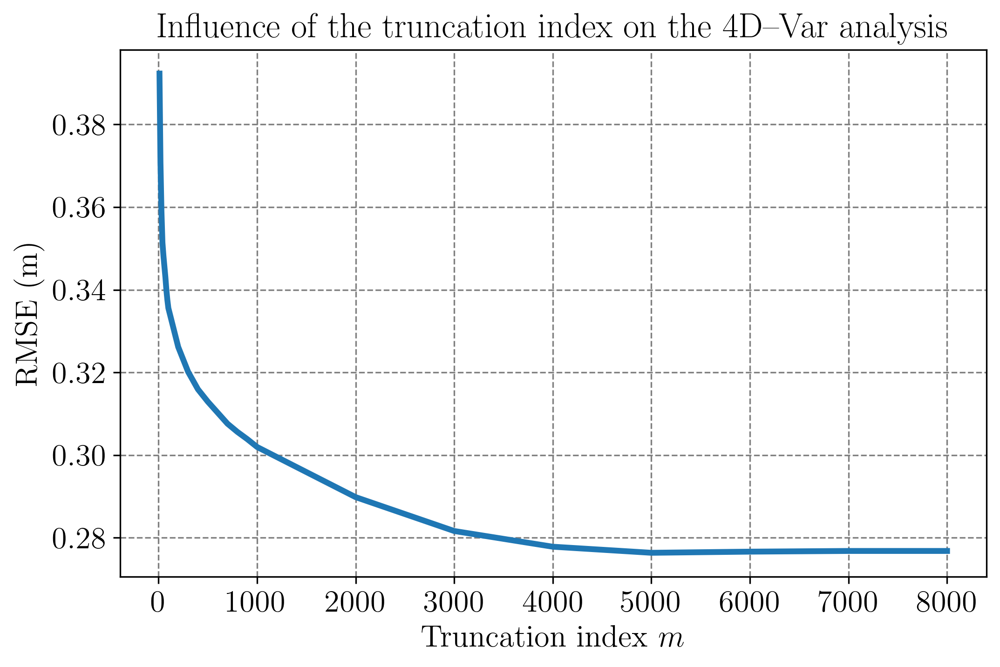

In [17]:
k = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000]
print(np.shape(k))

rmse_k = np.zeros((26, 45, 32))

rmse_k[0] = np.load('18Avril/test_k10/rmse.npy').reshape((45, 32))
rmse_k[1] = np.load('18Avril/test_k20/rmse.npy').reshape((45, 32))
rmse_k[2] = np.load('18Avril/test_k30/rmse.npy').reshape((45, 32))
rmse_k[3] = np.load('18Avril/test_k40/rmse.npy').reshape((45, 32))
rmse_k[4] = np.load('18Avril/test_k50/rmse.npy').reshape((45, 32))
rmse_k[5] = np.load('18Avril/test_k60/rmse.npy').reshape((45, 32))
rmse_k[6] = np.load('18Avril/test_k70/rmse.npy').reshape((45, 32))
rmse_k[7] = np.load('18Avril/test_k80/rmse.npy').reshape((45, 32))
rmse_k[8] = np.load('18Avril/test_k90/rmse.npy').reshape((45, 32))
rmse_k[9] = np.load('18Avril/test_k100/rmse.npy').reshape((45, 32))
rmse_k[10] = np.load('18Avril/test_k200/rmse.npy').reshape((45, 32))
rmse_k[11] = np.load('18Avril/test_k300/rmse.npy').reshape((45, 32))
rmse_k[12] = np.load('18Avril/test_k400/rmse.npy').reshape((45, 32))
rmse_k[13] = np.load('18Avril/test_k500/rmse.npy').reshape((45, 32))
rmse_k[14] = np.load('18Avril/test_k600/rmse.npy').reshape((45, 32))
rmse_k[15] = np.load('18Avril/test_k700/rmse.npy').reshape((45, 32))
rmse_k[16] = np.load('18Avril/test_k800/rmse.npy').reshape((45, 32))
rmse_k[17] = np.load('18Avril/test_k900/rmse.npy').reshape((45, 32))
rmse_k[18] = np.load('18Avril/test_k1000/rmse.npy').reshape((45, 32))
rmse_k[19] = np.load('18Avril/test_k2000/rmse.npy').reshape((45, 32))
rmse_k[20] = np.load('18Avril/test_k3000/rmse.npy').reshape((45, 32))
rmse_k[21] = np.load('18Avril/test_k4000/rmse.npy').reshape((45, 32))
rmse_k[22] = np.load('18Avril/test_k5000/rmse.npy').reshape((45, 32))
rmse_k[23] = np.load('18Avril/test_k6000/rmse.npy').reshape((45, 32))
rmse_k[24] = np.load('18Avril/test_k7000/rmse.npy').reshape((45, 32))
rmse_k[25] = np.load('18Avril/test_k8000/rmse.npy').reshape((45, 32))
plt.rcParams['axes.facecolor'] = 'xkcd:white'

plt.figure(figsize = (8, 5))
plt.plot(k, C*rmse_k.mean(axis = (1, 2)))
plt.xlabel('Truncation index $m$', fontsize = 16)
plt.ylabel('RMSE (m)', fontsize = 16)
plt.title('Influence of the truncation index on the 4D--Var analysis', fontsize = 18)

plt.savefig('fig13.pdf', dpi = 300, bbox_inches='tight')

# Inflation

In [44]:
J_min = np.zeros((29, 45))
J_min[0] = np.load("2Avril/test_inf06_EOF_adapt/J_min.npy")[:45]
J_min[1] = np.load("2Avril/test_inf065_EOF_adapt/J_min.npy")[:45]
J_min[2] = np.load("2Avril/test_inf07_EOF_adapt/J_min.npy")[:45]
J_min[3] = np.load("2Avril/test_inf075_EOF_adapt/J_min.npy")[:45]
J_min[4] = np.load("2Avril/test_inf08_EOF_adapt/J_min.npy")[:45]
J_min[5] = np.load("2Avril/test_inf085_EOF_adapt/J_min.npy")[:45]
J_min[6] = np.load("2Avril/test_inf09_EOF_adapt/J_min.npy")[:45]
J_min[7] = np.load("2Avril/test_inf095_EOF_adapt/J_min.npy")[:45]
J_min[8] = np.load("2Avril/test_inf1_EOF_adapt/J_min.npy")[:45]
J_min[9] = np.load("2Avril/test_inf105_EOF_adapt/J_min.npy")[:45]
J_min[10] = np.load("2Avril/test_inf11_EOF_adapt/J_min.npy")[:45]
J_min[11] = np.load("2Avril/test_inf115_EOF_adapt/J_min.npy")[:45]
J_min[12] = np.load("2Avril/test_inf12_EOF_adapt/J_min.npy")[:45]
J_min[13] = np.load("2Avril/test_inf125_EOF_adapt/J_min.npy")[:45]
J_min[14] = np.load("2Avril/test_inf13_EOF_adapt/J_min.npy")[:45]
J_min[15] = np.load("2Avril/test_inf135_EOF_adapt/J_min.npy")[:45]
J_min[16] = np.load("2Avril/test_inf14_EOF_adapt/J_min.npy")[:45]
J_min[17] = np.load("2Avril/test_inf145_EOF_adapt/J_min.npy")[:45]
J_min[18] = np.load("2Avril/test_inf15_EOF_adapt/J_min.npy")[:45]
J_min[19] = np.load("2Avril/test_inf155_EOF_adapt/J_min.npy")[:45]
J_min[20] = np.load("2Avril/test_inf16_EOF_adapt/J_min.npy")[:45]
J_min[21] = np.load("2Avril/test_inf165_EOF_adapt/J_min.npy")[:45]
J_min[22] = np.load("2Avril/test_inf17_EOF_adapt/J_min.npy")[:45]
J_min[23] = np.load("2Avril/test_inf175_EOF_adapt/J_min.npy")[:45]
J_min[24] = np.load("2Avril/test_inf18_EOF_adapt/J_min.npy")[:45]
J_min[25] = np.load("2Avril/test_inf185_EOF_adapt/J_min.npy")[:45]
J_min[26] = np.load("2Avril/test_inf19_EOF_adapt/J_min.npy")[:45]
J_min[27] = np.load("2Avril/test_inf195_EOF_adapt/J_min.npy")[:45]
J_min[28] = np.load("2Avril/test_inf2_EOF_adapt/J_min.npy")[:45]
lambda_EOF_adapt = [0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1, 1.05, 1.1, 1.15, 1.2, 1.25, 1.3, 1.35, 1.4, 1.45, 1.5, 1.55, 1.6, 1.65, 1.7,1.75, 1.8, 1.85, 1.9, 1.95, 2]

Text(0.5, 1.0, 'J depending on inflation')

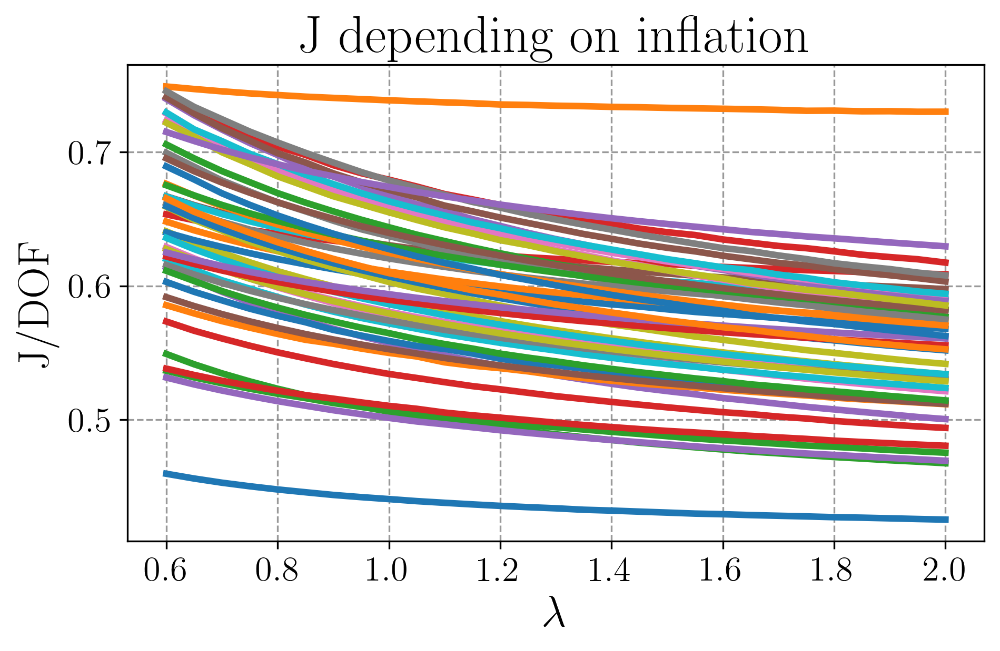

In [47]:
DOF = 8871*4
plt.plot(lambda_EOF_adapt, J_min/DOF)
plt.ylabel('J/DOF')
plt.xlabel('$\lambda$')
plt.title("J depending on inflation")


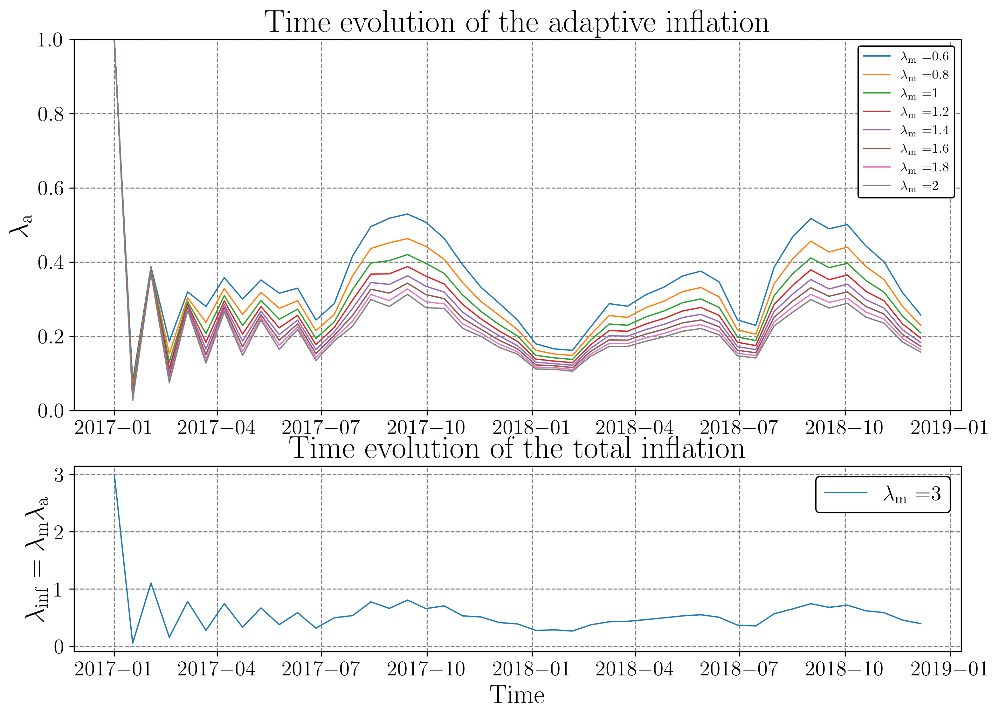

In [22]:
DOF = 8871*4

inflation_EOF_adapt = np.zeros((29, 45))
inflation_EOF_adapt[0] = np.load("2Avril/test_inf06_EOF_adapt/adapt_inf.npy")[:45]/0.6
inflation_EOF_adapt[1] = np.load("2Avril/test_inf08_EOF_adapt/adapt_inf.npy")[:45]/0.8
inflation_EOF_adapt[2] = np.load("2Avril/test_inf1_EOF_adapt/adapt_inf.npy")[:45]/1
inflation_EOF_adapt[3] = np.load("2Avril/test_inf12_EOF_adapt/adapt_inf.npy")[:45]/1.2
inflation_EOF_adapt[4] = np.load("2Avril/test_inf14_EOF_adapt/adapt_inf.npy")[:45]/1.4
inflation_EOF_adapt[5] = np.load("2Avril/test_inf16_EOF_adapt/adapt_inf.npy")[:45]/1.6
inflation_EOF_adapt[6] = np.load("2Avril/test_inf18_EOF_adapt/adapt_inf.npy")[:45]/1.8
inflation_EOF_adapt[7] = np.load("2Avril/test_inf2_EOF_adapt/adapt_inf.npy")[:45]/2
inflation_EOF_adapt_fin = np.load("2Avril/test_inf3_EOF_adapt/adapt_inf.npy")[:45]

lambda_plot = [0.6, 0.8, 1, 1.2, 1.4, 1.6, 1.8, 2]
fig, (ax1, ax2) = plt.subplots(2,1, figsize = (12,8.5), gridspec_kw={'height_ratios': [2,1]})
ax1.set_ylim([0,1])
for i in range(8):
    ax1.plot(time[:45*32:32], inflation_EOF_adapt[i], linewidth = 1, label = "$\lambda_{\mathrm{m}}$ ="+ "{}".format(lambda_plot[i]))
ax1.set_title('Time evolution of the adaptive inflation')
ax1.legend(loc='upper right', fontsize=10)
ax1.set_ylabel('$\lambda_{\mathrm{a}}$')

ax2.plot(time[:45*32:32], inflation_EOF_adapt_fin, linewidth = 1, label = "$\lambda_{\mathrm{m}}$ ="+ "{}".format(str(3)))
ax2.set_xlabel('Time')
ax2.set_title('Time evolution of the total inflation')
ax2.legend(loc = 'upper right')
ax2.set_ylabel('$\lambda_{\mathrm{inf}} = \lambda_{\mathrm{m}}\lambda_{\mathrm{a}}$')
plt.savefig('lambda_seasonality.pdf', dpi = 300, bbox_inches='tight', pad_inches=0.1)

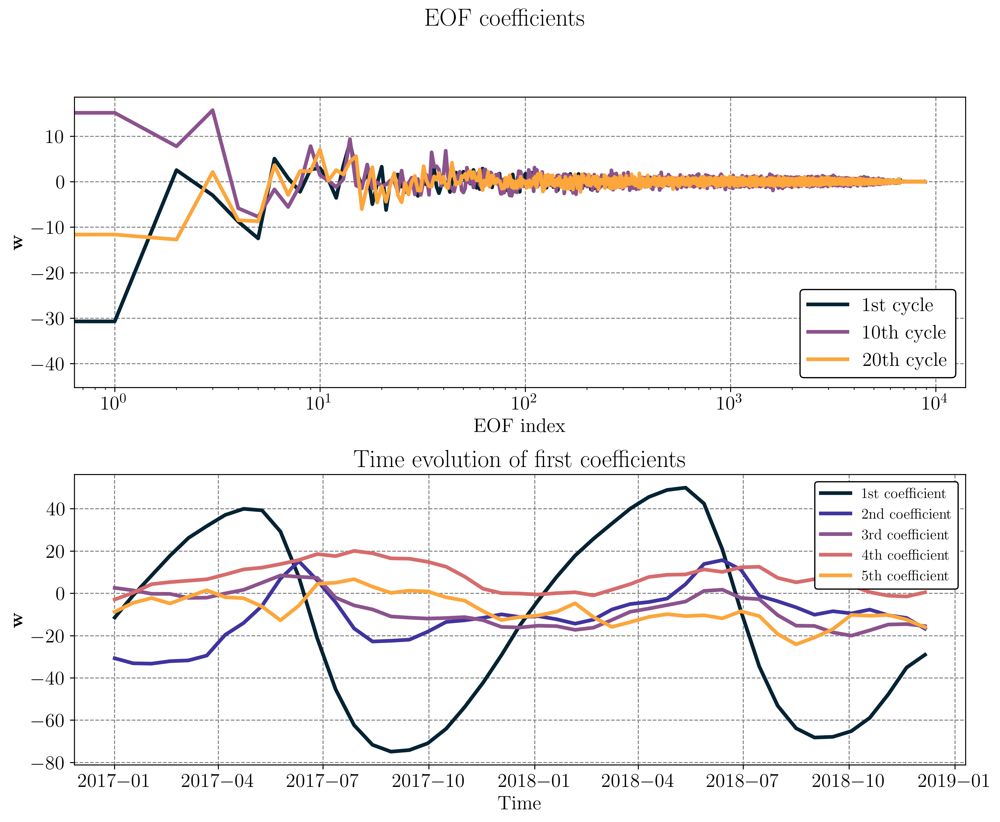

In [40]:
state = np.zeros((45, 8871))
plt.rcParams['axes.facecolor'] = 'xkcd:white'
cmap_EOF = plt.get_cmap('cmo.thermal')
colors_EOF = cmap_EOF(np.linspace(0,1,6))

state1 =np.load('14Avril/test_EOF_inf1_gauss/state_0.npy')
for i in range(45):
    state[i] =np.load('14Avril/test_EOF_inf1_gauss/state_{}.npy'.format(str(i)))
#state = xbar + EOF@np.reshape(grad1, (8871,1))

fig = plt.figure(figsize = (13, 10))
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.15, hspace=0.3)
ax1 = plt.subplot2grid((2,1), (0, 0))
ax2 = plt.subplot2grid((2,1), (1, 0))
                                
#ax1.set_title('HR SIT', fontsize = 14)
ax1.semilogx(state[0], label = '1st cycle', color = colors_EOF[0])
ax1.semilogx(state[10], label = '10th cycle', color = colors_EOF[2])
ax1.semilogx(state[20], label = '20th cycle', color = colors_EOF[4])
ax1.set_xlabel('EOF index', fontsize = 16)                  
ax1.set_ylabel('$\mathbf{w}$', fontsize = 16)                   
ax1.legend()
ax2.plot(time[:45*32:32],state[:,0], label = '1st coefficient', color = colors_EOF[0])
ax2.plot(time[:45*32:32],state[:,1], label = '2nd coefficient', color = colors_EOF[1])
ax2.plot(time[:45*32:32],state[:,2], label = '3rd coefficient', color = colors_EOF[2])
ax2.plot(time[:45*32:32],state[:,3], label = '4th coefficient', color = colors_EOF[3])
ax2.plot(time[:45*32:32],state[:,4], label = '5th coefficient', color = colors_EOF[4])
ax2.legend(fontsize = 12)
ax2.set_xlabel('Time', fontsize = 16)
ax2.set_ylabel('$\mathbf{w}$', fontsize = 16)      
plt.suptitle('EOF coefficients', fontsize = 20)
ax2.set_title('Time evolution of first coefficients', fontsize = 20)
plt.savefig('weight_seasonality.pdf', dpi = 300, bbox_inches='tight', pad_inches=0.1)

In [2]:
import xarray as xr
cs2smos = xr.open_dataset('sit_obs_2018.nc')
cs2smos

/opt/anaconda3/lib/python3.9/site-packages/xarray/backends/plugins.py:71: RuntimeWarning: Engine 'cfgrib' loading failed:
Cannot find the ecCodes library
  warnings.warn(f"Engine {name!r} loading failed:\n{ex}", RuntimeWarning)


<xarray.Dataset>
Dimensions:                     (time: 101, prec: 1, x: 128, y: 128, lat: 128,
                                 lon: 128)
Coordinates:
  * time                        (time) datetime64[ns] 2018-01-04T12:00:00 ......
  * prec                        (prec) int64 0
    lat                         (x, y) float32 ...
    lon                         (x, y) float32 ...
Dimensions without coordinates: x, y
Data variables:
    analysis_sea_ice_thickness  (time, prec, lat, lon) float64 ...

(128, 128)


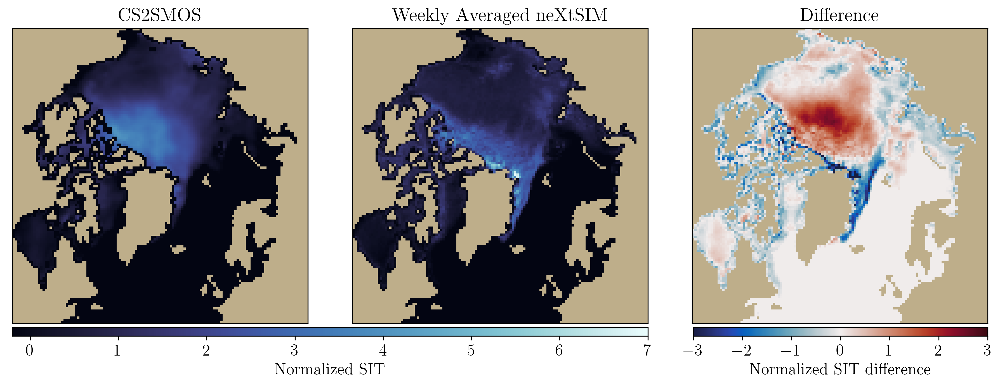

In [8]:
cs2smos = xr.open_dataset('sit_obs_2018.nc')
sit_cs2smos=cs2smos.analysis_sea_ice_thickness[0]
sit_nextsim = np.mean(truth[:14],axis = 0)
print(np.shape(sit_nextsim))
plt.rcParams['axes.facecolor'] = 'xkcd:putty'

fig = plt.figure(figsize = (15, 5))
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.15, hspace=0.15)
ax1 = plt.subplot2grid((1, 3), (0, 0))
ax2 = plt.subplot2grid((1, 3), (0, 1))
ax3 = plt.subplot2grid((1, 3), (0, 2))


ax1.set_title('CS2SMOS', fontsize = 16)
im1 = ax1.imshow(ma.masked_array(sit_cs2smos[0], mask = 1 - mask), origin = 'lower', cmap = cmocean.cm.ice, vmin = -0.2, vmax = 7)

ax1.grid(False)
ax1.set_xticks([])
ax1.set_yticks([])

ax2.set_title('Weekly Averaged neXtSIM', fontsize = 16)
im2 = ax2.imshow(ma.masked_array(sit_nextsim, mask = 1 - mask), origin = 'lower', cmap = cmocean.cm.ice, vmin = -0.2, vmax = 7)
ax2.set_xticks([])
ax2.set_yticks([])

ax2.grid(False)

ax3.set_title('Difference', fontsize = 16)
im3 = ax3.imshow(ma.masked_array(sit_cs2smos[0]-sit_nextsim, mask = 1 - mask), origin = 'lower', cmap = cmocean.cm.balance, vmin = -3, vmax = 3)
ax3.set_xticks([])
ax3.set_yticks([])

ax3.grid(False)


cbar_ax1 = fig.add_axes([0.125, 0.12, 0.505, 0.02])  # [left, bottom, width, height]

cb1 = fig.colorbar(im1, ax=[ax1], cax = cbar_ax1, orientation='horizontal')
cb1.ax.tick_params(labelsize=14)


cbar_ax3 = fig.add_axes([.666, 0.12, 0.234, 0.02])

cb3 = fig.colorbar(im3, ax=[ax3], cax = cbar_ax3, orientation='horizontal')
cb3.ax.tick_params(labelsize=14)
cb3.set_label("Normalized SIT difference", fontsize = 14)
cb1.set_label("Normalized SIT", fontsize = 14)
                                    
plt.savefig('fig02.pdf', dpi = 300,  bbox_inches='tight', pad_inches=0.1)

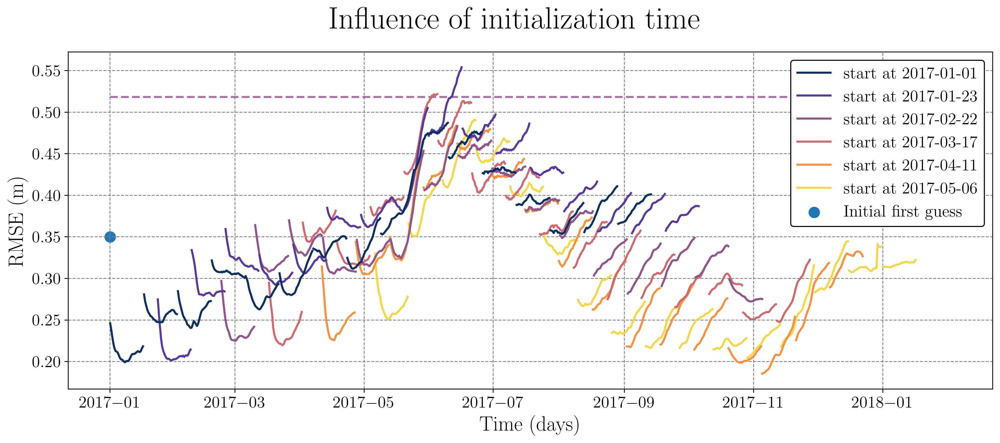

In [7]:
truth= np.load('1Mars/test_start0/x_truth.npy')
import datetime as dt
obs_4Dvar_gaussnoise = np.load('1Mars/test_start0/obs.npy')

rmse_4Dvar_start0 = C*np.load('1Mars/test_start0/rmse.npy')
rmse_ana_4Dvar_start0 = C*np.load('1Mars/test_start0/rmse_analysis.npy')


rmse_4Dvar_start90 = C*np.load('1Mars/test_start90/rmse.npy')
rmse_ana_4Dvar_start90 = C*np.load('1Mars/test_start90/rmse_analysis.npy')


rmse_4Dvar_start210 = C*np.load('1Mars/test_start210/rmse.npy')
rmse_ana_4Dvar_start210 = C*np.load('1Mars/test_start210/rmse_analysis.npy')

rmse_4Dvar_start300 = C*np.load('5Mars/test_start300/rmse.npy')
rmse_ana_4Dvar_start300 = C*np.load('5Mars/test_start300/rmse_analysis.npy')

rmse_4Dvar_start400 = C*np.load('5Mars/test_start400/rmse.npy')
rmse_ana_4Dvar_start400 = C*np.load('5Mars/test_start400/rmse_analysis.npy')

rmse_4Dvar_start500 = C*np.load('5Mars/test_start500/rmse.npy')
rmse_ana_4Dvar_start500 = C*np.load('5Mars/test_start500/rmse_analysis.npy')
sit_input = np.load('1Mars/test_start0/sit_input.npy')
def rmse2(x, y):
    return np.sqrt(np.mean((x - y)**2))
rmse_gauss = C*rmse(obs_4Dvar_gaussnoise[:8*16], truth[::4])
#rmse_frac = rmse(obs_4Dvar_fracnoise[:8*16], truth[::4])
N = np.arange(36*5+1)/2
N2 = np.arange(20*56 + 1)/2
plt.rcParams['axes.facecolor'] = 'xkcd:white'
cmap = plt.get_cmap('cmo.thermal')
colors = cmap(np.linspace(0,1,13))

fig, ax1 = plt.subplots(1, 1, figsize = (16,6), sharex = True, sharey = True)

ax1.hlines(rmse_gauss.mean(), time[0],time[250+32*16+32], color = colors[5], alpha = 0.8, linewidth = 2, linestyle = 'dashed')

ax1.plot(time[:32], rmse_4Dvar_start0[:32], color = colors[1], linewidth = 2, 
         label = 'start at {}'.format(str(time[0])[:10]))
ax1.plot(time[45:32+45], rmse_4Dvar_start90[:32], color = colors[3], linewidth = 2, 
         label = 'start at {}'.format(str(time[45])[:10]))
ax1.plot(time[105:32+105], rmse_4Dvar_start210[:32], color = colors[5], linewidth = 2, 
         label = 'start at {}'.format(str(time[105])[:10]))
ax1.plot(time[150:32+150], rmse_4Dvar_start300[:32], color = colors[7], linewidth = 2,
         label = 'start at {}'.format(str(time[150])[:10]))
ax1.plot(time[200:32+200], rmse_4Dvar_start400[:32], color = colors[9], linewidth = 2, 
         label = 'start at {}'.format(str(time[200])[:10]))
ax1.plot(time[250:32+250], rmse_4Dvar_start500[:32], color = colors[11], linewidth = 2, 
         label = 'start at {}'.format(str(time[250])[:10]))

ax1.scatter(time[0], rmse2(sit_input, truth[0]*mask.squeeze()), label = 'Initial first guess')

for i in range(1, 16):
    ax1.plot(time[32*i:32*i+32], rmse_4Dvar_start0[32*i:32*i+32], color = colors[1], linewidth = 2)
    ax1.plot(time[45+32*i:45+32*i+32], rmse_4Dvar_start90[32*i:32*i+32], color = colors[3], linewidth = 2)
    ax1.plot(time[105+32*i:105+32*i+32], rmse_4Dvar_start210[32*i:32*i+32], color = colors[5], linewidth = 2)
    ax1.plot(time[150+32*i:150+32*i+32], rmse_4Dvar_start300[32*i:32*i+32], color = colors[7], linewidth = 2)
    ax1.plot(time[200+32*i:200+32*i+32], rmse_4Dvar_start400[32*i:32*i+32], color = colors[9], linewidth = 2)
    ax1.plot(time[250+32*i:250+32*i+32], rmse_4Dvar_start500[32*i:32*i+32], color = colors[11], linewidth = 2)


ax1.legend()

#plt.ylim([0, 2])
ax1.set_xlabel('Time (days)')
ax1.set_ylabel('RMSE (m)')
plt.suptitle('Influence of initialization time', fontsize = 30)
plt.savefig('time_start_RMSEx_ana.pdf', dpi = 300,  bbox_inches='tight', pad_inches=0.1)


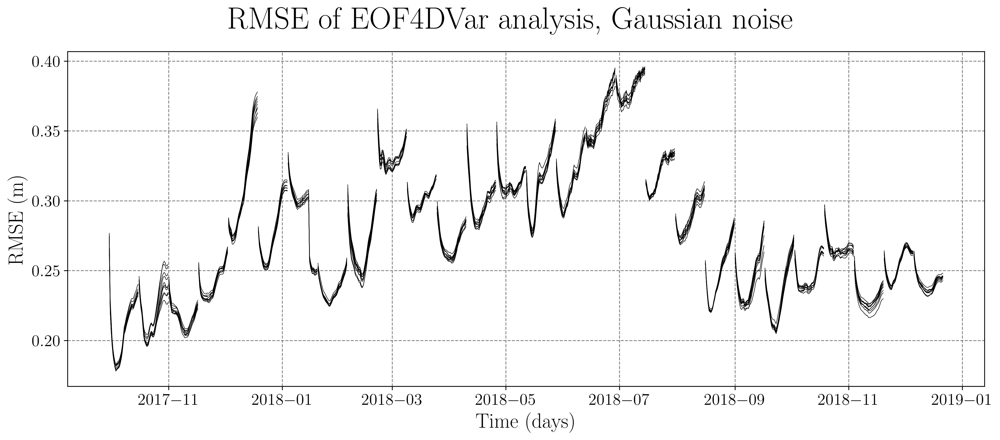

In [19]:
rmse_1 = C*np.load('25Mars/test_random1_inf13_adapt/rmse.npy').reshape((1, 28*32))
rmse_2 = C*np.load('25Mars/test_random2_inf13_adapt/rmse.npy').reshape((1, 28*32))
rmse_3 = C*np.load('25Mars/test_random3_inf13_adapt/rmse.npy').reshape((1, 28*32))
rmse_4 = C*np.load('25Mars/test_random4_inf13_adapt/rmse.npy').reshape((1, 28*32))
rmse_5 = C*np.load('25Mars/test_random5_inf13_adapt/rmse.npy').reshape((1, 28*32))
rmse_6 = C*np.load('25Mars/test_random6_inf13_adapt/rmse.npy').reshape((1, 28*32))
rmse_7 = C*np.load('25Mars/test_random7_inf13_adapt/rmse.npy').reshape((1, 28*32))
rmse_8 = C*np.load('25Mars/test_random8_inf13_adapt/rmse.npy').reshape((1, 28*32))
rmse_9 = C*np.load('25Mars/test_random9_inf13_adapt/rmse.npy').reshape((1, 28*32))
rmse_10 = C*np.load('25Mars/test_random10_inf13_adapt/rmse.npy').reshape((1, 28*32))

N = np.arange(36*5+1)/2
N2 = np.arange(20*56 + 1)/2
plt.rcParams['axes.facecolor'] = 'xkcd:white'
cmap = plt.get_cmap('cmo.thermal')
colors = cmap(np.linspace(0,1,5))

fig, ax1 = plt.subplots(1, 1, figsize = (16,6), sharex = True, sharey = True)

#ax1.hlines(rmse_gauss.mean(), time[0],time[32*35], color = colors[5], label = 'gaussian observation', alpha = 0.8, linewidth = 2, linestyle = 'dashed')
N_start =  34*16
ax1.plot(time[N_start:32 + N_start], rmse_1[0, :32], color = 'k', linewidth = 0.5)
ax1.plot(time[N_start:32+ N_start], rmse_2[0,:32], color = 'k', linewidth =  0.5)
ax1.plot(time[N_start:32+ N_start], rmse_3[0,:32], color = 'k', linewidth =  0.5)
ax1.plot(time[N_start:32+ N_start], rmse_4[0,:32], color = 'k', linewidth = 0.5)
ax1.plot(time[N_start:32+ N_start], rmse_5[0,:32], color = 'k', linewidth =  0.5)
ax1.plot(time[N_start:32+ N_start], rmse_6[0,:32], color = 'k', linewidth =  0.5)
ax1.plot(time[N_start:32+ N_start], rmse_7[0,:32], color = 'k', linewidth =  0.5)
ax1.plot(time[N_start:32+ N_start], rmse_8[0,:32], color = 'k', linewidth =  0.5)
ax1.plot(time[N_start:32+ N_start], rmse_9[0,:32], color = 'k', linewidth =  0.5)
ax1.plot(time[N_start:32+ N_start], rmse_10[0,:32], color = 'k', linewidth =  0.5)

for i in range(1, 28):
    ax1.plot(time[32*i+ N_start:32*i+32+ N_start], rmse_1[0,32*i:32*i+32], color = 'k', linewidth =  0.5)
    ax1.plot(time[32*i+ N_start:32*i+32+ N_start], rmse_2[0,32*i:32*i+32], color = 'k', linewidth =  0.5)
    ax1.plot(time[32*i+ N_start:32*i+32+ N_start], rmse_3[0,32*i:32*i+32], color = 'k', linewidth =  0.5)
    ax1.plot(time[32*i+ N_start:32*i+32+ N_start], rmse_4[0,32*i:32*i+32], color = 'k', linewidth =  0.5)
    ax1.plot(time[32*i+ N_start:32*i+32+ N_start], rmse_5[0,32*i:32*i+32], color = 'k', linewidth =  0.5)
    ax1.plot(time[32*i+ N_start:32*i+32+ N_start], rmse_6[0,32*i:32*i+32], color = 'k', linewidth =  0.5)
    ax1.plot(time[32*i+ N_start:32*i+32+ N_start], rmse_7[0,32*i:32*i+32], color = 'k', linewidth =  0.5)
    ax1.plot(time[32*i+ N_start:32*i+32+ N_start], rmse_8[0,32*i:32*i+32], color = 'k', linewidth =  0.5)
    ax1.plot(time[32*i+ N_start:32*i+32+ N_start], rmse_9[0,32*i:32*i+32], color = 'k', linewidth =  0.5)
    ax1.plot(time[32*i+ N_start:32*i+32+ N_start], rmse_10[0,32*i:32*i+32], color = 'k', linewidth =  0.5)


#plt.ylim([0, 2])
ax1.set_xlabel('Time (days)')
ax1.set_ylabel('RMSE (m)')
plt.suptitle('RMSE of EOF4DVar analysis, Gaussian noise', fontsize = 30)
#plt.savefig('RMSEx_EOFana.png', dpi = 300)
plt.savefig('RMSE_randomseed.pdf', dpi = 300,  bbox_inches='tight', pad_inches=0.1)

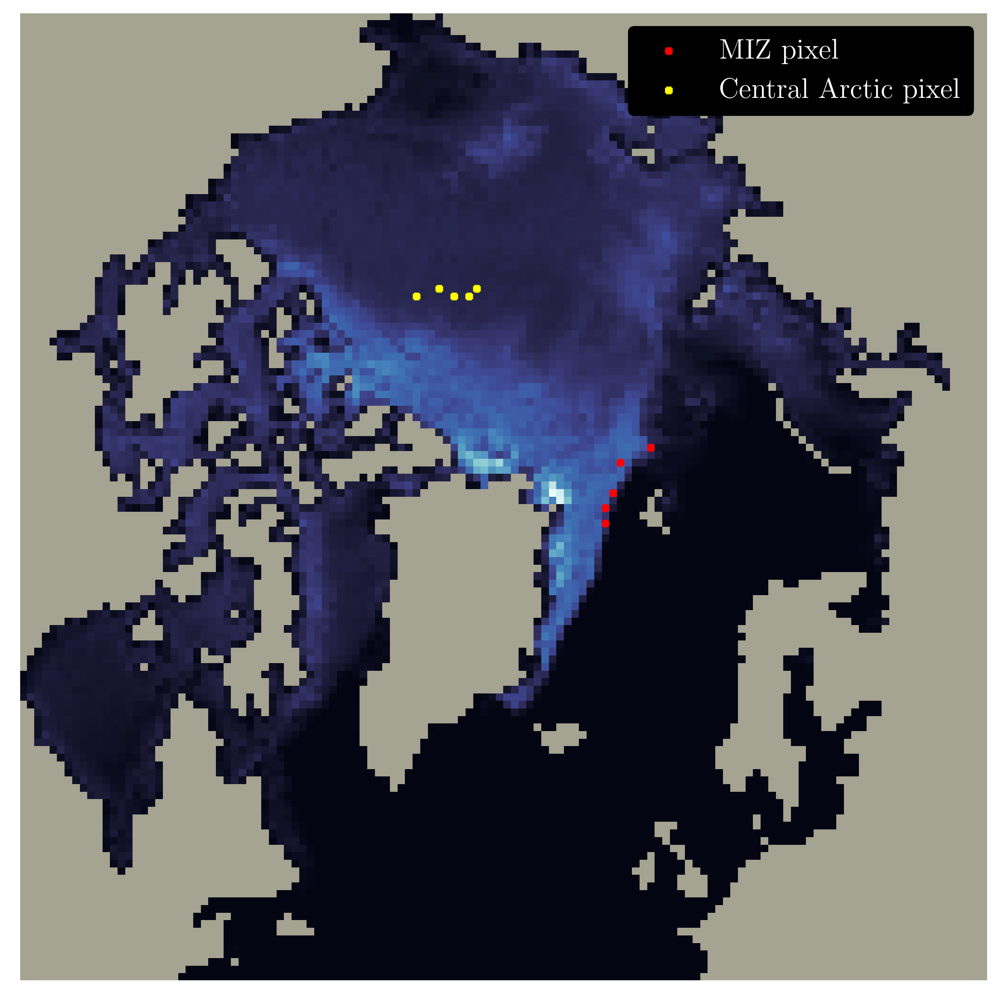

In [128]:
xana2 = np.load('14Avril/test_EOF_inf1_frac/x_truth.npy')
xbar = np.load('mean_norm.npy').reshape(8871,1)
EOF = np.load('EOFs_y8_norm.npy')[:,:8871]
state = xbar 
h_MIZ = np.eye(8871,k = 4195)[0]

state2D = np.zeros((128*128))
state2D[unflatten] = 100*h_MIZ.reshape(8871)
state2D1 = state2D.reshape((128,128))
#x_MIZ_1 = np.argmax(state2D1)//128
#y_MIZ_1 = np.argmax(state2D1) - x_MIZ_1*128

h_CA = np.zeros(8871)
h_CA[6832] = 1

state2D = np.zeros((128*128))
state2D[unflatten] = 100*h_CA.reshape(8871)
state2D1 = state2D.reshape((128,128))
x_CA_1 = np.argmax(state2D1)//128
y_CA_1 = np.argmax(state2D1) - x_CA_1*128

plt.rcParams['axes.facecolor'] = 'xkcd:cement'

plt.figure(figsize = (10, 10))
plt.imshow(ma.masked_array(xana2[0], mask = 1 - mask), origin = 'lower', cmap = cmocean.cm.ice, vmax = 7)
plt.scatter(y_MIZ_1, x_MIZ_1, color='red', marker='+', s=20, label = 'MIZ pixels')  # 's' controls the marker size
plt.scatter(y_MIZ_2, x_MIZ_2, color='red', marker='+', s=20)  # 's' controls the marker size
plt.scatter(y_MIZ_3, x_MIZ_3, color='red', marker='+', s=20)
plt.scatter(y_MIZ_4, x_MIZ_4, color='red', marker='+', s=20)
plt.scatter(y_MIZ_5, x_MIZ_5, color='red', marker='+', s=20)
plt.scatter(y_CA_1, x_CA_1, color='yellow', marker='+', s=20, label = 'Central Arctic pixels')  # 's' controls the marker size
plt.scatter(y_CA_2, x_CA_2, color='yellow', marker='+', s=20)  # 's' controls the marker size
plt.scatter(y_CA_3, x_CA_3, color='yellow', marker='+', s=20)
plt.scatter(y_CA_4, x_CA_4, color='yellow', marker='+', s=20)
plt.scatter(y_CA_5, x_CA_5, color='yellow', marker='+', s=20)

plt.legend(labelcolor = 'white')
plt.grid(False)
plt.xticks([])
plt.yticks([])
plt.savefig('position_pixel.pdf',bbox_inches='tight', pad_inches=0.1)

In [110]:
h_CA = np.zeros(8871)
h_CA[6832] = 1

state2D = np.zeros((128*128))
state2D[unflatten] = 100*h_CA.reshape(8871)
state2D1 = state2D.reshape((128,128))
x_CA_1 = np.argmax(state2D1)//128
y_CA_1 = np.argmax(state2D1) - x_CA_1*128

h_CA = np.zeros(8871)
h_CA[6825] = 1

state2D = np.zeros((128*128))
state2D[unflatten] = 100*h_CA.reshape(8871)
state2D1 = state2D.reshape((128,128))
x_CA_2 = np.argmax(state2D1)//128
y_CA_2 = np.argmax(state2D1) - x_CA_2*128


h_CA = np.zeros(8871)
h_CA[6830] = 1

state2D = np.zeros((128*128))
state2D[unflatten] = 100*h_CA.reshape(8871)
state2D1 = state2D.reshape((128,128))
x_CA_3 = np.argmax(state2D1)//128
y_CA_3 = np.argmax(state2D1) - x_CA_3*128


h_CA = np.zeros(8871)
h_CA[6905] = 1

state2D = np.zeros((128*128))
state2D[unflatten] = 100*h_CA.reshape(8871)
state2D1 = state2D.reshape((128,128))
x_CA_4 = np.argmax(state2D1)//128
y_CA_4 = np.argmax(state2D1) - x_CA_4*128


h_CA = np.zeros(8871)
h_CA[6910] = 1

state2D = np.zeros((128*128))
state2D[unflatten] = 100*h_CA.reshape(8871)
state2D1 = state2D.reshape((128,128))
x_CA_5 = np.argmax(state2D1)//128
y_CA_5 = np.argmax(state2D1) - x_CA_5*128



In [126]:
h_MIZ = np.zeros(8871)
h_MIZ[4812] = 1

state2D = np.zeros((128*128))
state2D[unflatten] = 100*h_MIZ.reshape(8871)
state2D1 = state2D.reshape((128,128))
x_MIZ_1 = np.argmax(state2D1)//128
y_MIZ_1 = np.argmax(state2D1) - x_MIZ_1*128

h_MIZ = np.zeros(8871)
h_MIZ[4195] = 1

state2D = np.zeros((128*128))
state2D[unflatten] = 100*h_MIZ.reshape(8871)
state2D1 = state2D.reshape((128,128))
x_MIZ_2 = np.argmax(state2D1)//128
y_MIZ_2 = np.argmax(state2D1) - x_MIZ_2*128


h_MIZ = np.zeros(8871)
h_MIZ[4334] = 1

state2D = np.zeros((128*128))
state2D[unflatten] = 100*h_MIZ.reshape(8871)
state2D1 = state2D.reshape((128,128))
x_MIZ_3 = np.argmax(state2D1)//128
y_MIZ_3 = np.argmax(state2D1) - x_MIZ_3*128


h_MIZ = np.zeros(8871)
h_MIZ[4483] = 1

state2D = np.zeros((128*128))
state2D[unflatten] = 100*h_MIZ.reshape(8871)
state2D1 = state2D.reshape((128,128))
x_MIZ_4 = np.argmax(state2D1)//128
y_MIZ_4 = np.argmax(state2D1) - x_MIZ_4*128


h_MIZ = np.zeros(8871)
h_MIZ[4998] = 1

state2D = np.zeros((128*128))
state2D[unflatten] = 100*h_MIZ.reshape(8871)
state2D1 = state2D.reshape((128,128))
x_MIZ_5 = np.argmax(state2D1)//128
y_MIZ_5 = np.argmax(state2D1) - x_MIZ_5*128



In [16]:
h_MIZ = np.zeros(8871)
h_MIZ[7070] = 1

state2D = np.zeros((128*128))
state2D[unflatten] = 100*h_MIZ.reshape(8871)
state2D1 = state2D.reshape((128,128))
x_MIZ_1 = np.argmax(state2D1)//128
y_MIZ_1 = np.argmax(state2D1) - x_MIZ_1*128
print(x_MIZ_1)
print(y_MIZ_1)

93
60


/var/folders/6n/yk3tn78x6lj4hfylvhsqtsmh0000gn/T/ipykernel_22068/2657484301.py:72: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust 'rect' to account for the suptitle


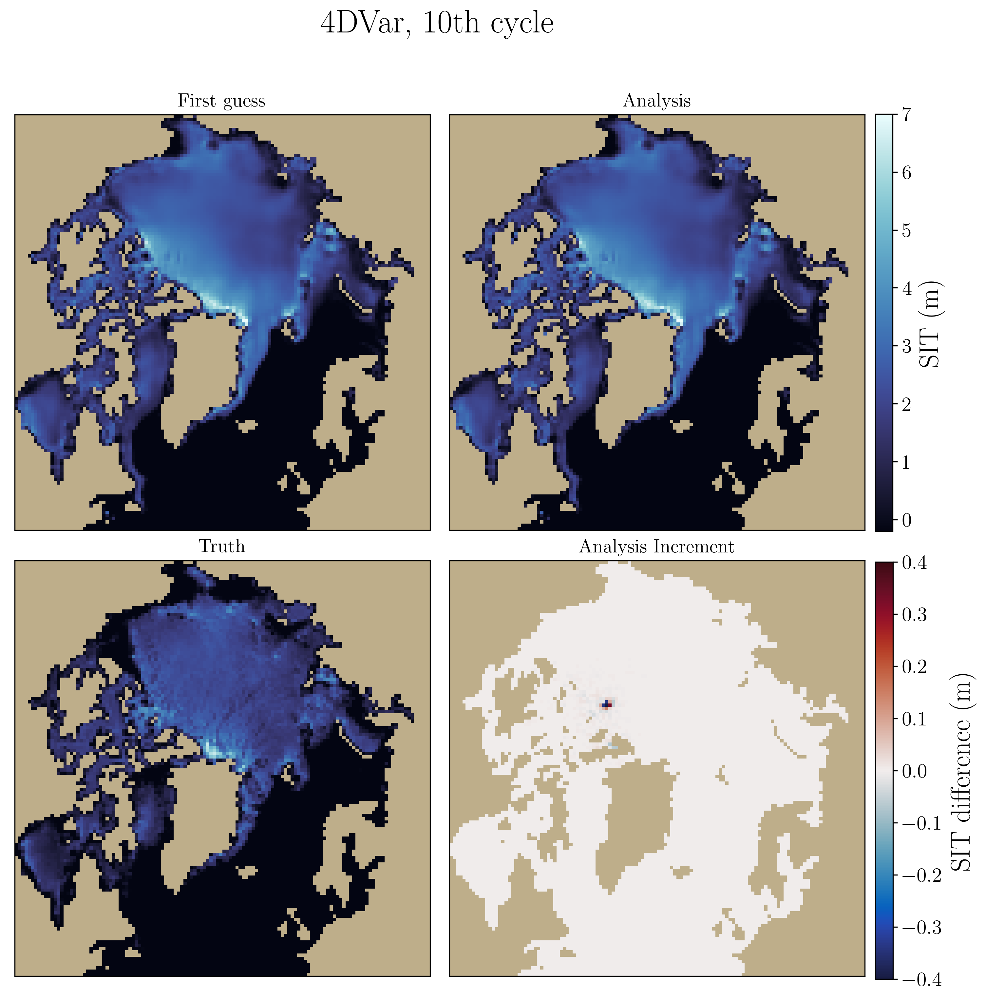

In [134]:
xana2 = np.load('test_one_obs/state_7.npy')
xbar = np.load('mean_norm.npy').reshape(8871,1)
EOF = np.load('EOFs_y8_norm.npy')[:,:8871]
state = xbar + EOF@np.reshape(xana2, (8871,1))
state2D = np.zeros((128*128))
state2D[unflatten] = xana2.reshape(8871)
state2D1 = state2D.reshape((128,128))

xback2 = np.load('test_one_obs/back_6.npy')
#xbar = np.load('EOF/mean.npy').reshape(8871,1)
#EOF = np.load('EOF/EOFs_y8.npy')[:,:7000]
#state = xbar + EOF@np.reshape(xback2, (7000,1))
state2D = np.zeros((128*128))
state2D[unflatten] = xback2.reshape(8871)
state2D2 = state2D.reshape((128,128))

plt.rcParams['axes.facecolor'] = 'xkcd:putty'

fig = plt.figure(figsize = (9,10.3))
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.4, hspace=0.4)
ax1 = plt.subplot2grid((2, 2), (0, 0))
ax2 = plt.subplot2grid((2, 2), (0, 1))
ax3 = plt.subplot2grid((2, 2), (1, 0))
ax4 = plt.subplot2grid((2, 2), (1, 1))                                    
ax1.set_title('First guess', fontsize = 14)
im1 = ax1.imshow(ma.masked_array(state2D2, mask = 1 - mask), origin = 'lower', cmap = cmocean.cm.ice, vmin = -0.2, vmax = 7)

ax1.grid(False)
ax1.set_xticks([])
ax1.set_yticks([])

ax2.set_title('Analysis', fontsize = 14)
im2 = ax2.imshow(ma.masked_array(state2D1, mask = 1 - mask), origin = 'lower', cmap = cmocean.cm.ice, vmin = -0.2, vmax = 7)
ax2.set_xticks([])
ax2.set_yticks([])

ax2.grid(False)

ax3.set_title('Truth', fontsize = 14)
im3 = ax3.imshow(ma.masked_array(truth[32*10].reshape((128,128)), mask = 1 - mask), origin = 'lower', cmap = cmocean.cm.ice, vmin = -0.2, vmax = 7)
ax3.set_xticks([])
ax3.set_yticks([])

ax3.grid(False)

ax4.set_title('Analysis Increment', fontsize = 14)
im4 = ax4.imshow(ma.masked_array( state2D1 - state2D2, mask = 1 - mask), origin = 'lower', cmap = cmocean.cm.balance, vmin = -0.4, vmax = 0.4)
ax4.grid(False)

ax4.set_xticks([])
ax4.set_yticks([])

#cbar_ax1 = fig.add_axes([0.48, 0.125, 0.02, 0.756])

#cb1 = fig.colorbar(im1, ax=[ax1, ax3], cax = cbar_ax1, aspect=18.5, pad=0)
#cb1.ax.tick_params(labelsize=15)

cbar_ax2 = fig.add_axes([0.995, 0.0225, 0.02, 0.412])

cb2 = fig.colorbar(im4, ax=[ax4], cax = cbar_ax2, aspect=18.5, pad=0)
cb2.ax.tick_params(labelsize=15)

cbar_ax3 = fig.add_axes([0.995, 0.465, 0.02, 0.412])

cb3 = fig.colorbar(im2, ax=[ax2], cax = cbar_ax3, aspect=18.5, pad=0)
cb3.ax.tick_params(labelsize=15)
cb3.set_label("SIT (m)")
cb2.set_label("SIT difference (m)")
#cb1.set_label("SIT (m)")
                                    
plt.suptitle('4DVar, 10th cycle', fontsize = 24)
fig.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust 'rect' to account for the suptitle

#plt.savefig('fig05.pdf', dpi = 300,  bbox_inches='tight', pad_inches=0.1)

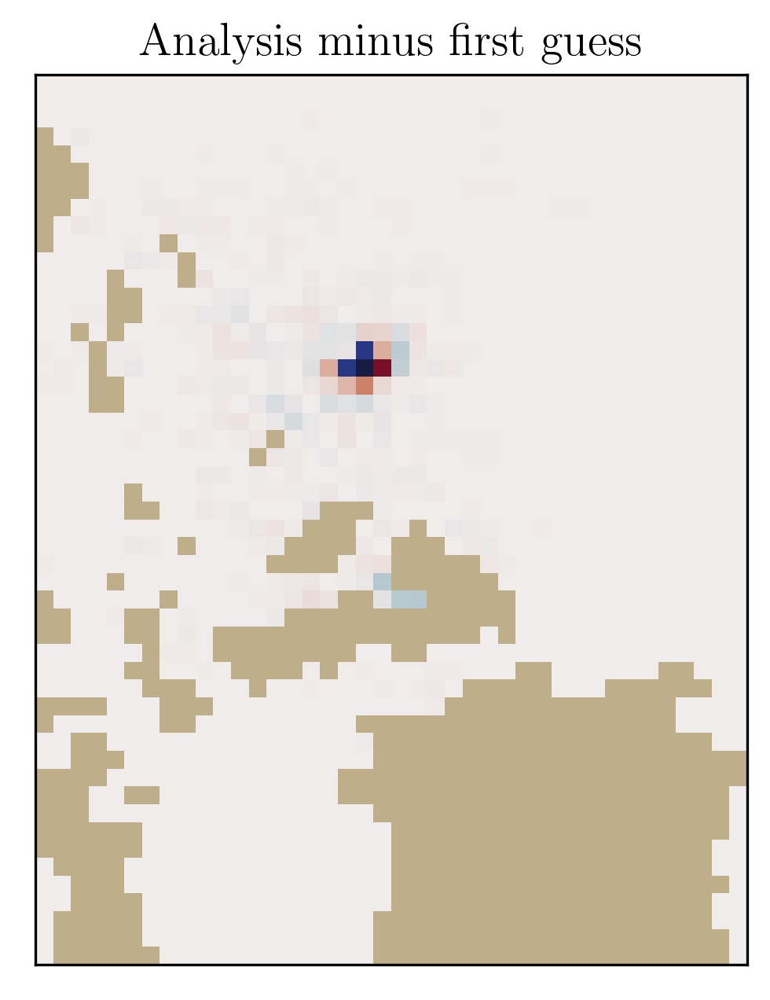

In [145]:
fig, ax4 = plt.subplots(1, 1, figsize = (5,5))
ax4.set_title('Analysis minus first guess', fontsize = 14)
im4 = ax4.imshow(ma.masked_array( state2D1[50:100,30:70] - state2D2[50:100,30:70], mask = 1 - mask[50:100,30:70]), origin = 'lower', cmap = cmocean.cm.balance, vmin = -0.4, vmax = 0.4)
ax4.grid(False)
#fig.colorbar(im4, label = 'SIT difference (normalized)')
ax4.set_xticks([])
ax4.set_yticks([])
plt.savefig("zoom_single_obs.png")